# Advanced test-set diagnostics for top worm-classification models

This notebook implements the diagnostics you asked for:

1. individual aggregation comparison  
3. confidence calibration  
5. individual prediction stability  
6. model-family agreement categories  
8. error image galleries  
9. confounding checks  
10. species × age interaction  
11. bootstrap confidence intervals by individual  

It expects the long test-set prediction table:

```text
all_top_model_test_set_image_predictions_long.csv
```

The notebook will also use an in-memory `test_predictions` dataframe if it already exists.


In [1]:
from __future__ import annotations

import math
import re
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm
from IPython.display import display, Markdown

from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score

pd.set_option("display.max_columns", 200)
pd.set_option("display.max_colwidth", 220)


## 0. Settings and load predictions

In [2]:
PROJECT_ROOT = Path("~/worm-species").expanduser().resolve()
OUTPUTS_ROOT = PROJECT_ROOT / "outputs_slurm"

# Edit if your previous notebook saved the test predictions elsewhere.
BASE_ANALYSIS_DIR = OUTPUTS_ROOT / "combined_sweep_analysis" / "same_individual_predictions_top_models"
TEST_ANALYSIS_DIR = BASE_ANALYSIS_DIR / "test_set_model_disagreement"

PREDICTION_CSV_CANDIDATES = [
    TEST_ANALYSIS_DIR / "all_top_model_test_set_image_predictions_long.csv",
    BASE_ANALYSIS_DIR / "all_top_model_test_set_image_predictions_long.csv",
    OUTPUTS_ROOT / "combined_sweep_analysis" / "test_set_model_disagreement" / "all_top_model_test_set_image_predictions_long.csv",
]

ADVANCED_DIR = TEST_ANALYSIS_DIR / "advanced_diagnostics"
ADVANCED_DIR.mkdir(parents=True, exist_ok=True)

TASKS = ["species", "genus", "age"]
METRICS = ["accuracy", "balanced_accuracy", "macro_f1"]

RANDOM_STATE = 42
N_GALLERY_IMAGES = 24
N_BOOTSTRAPS = 1000

print("Advanced diagnostics dir:", ADVANCED_DIR)


Advanced diagnostics dir: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics


In [3]:
def safe_slug(text: str, max_len: int = 90) -> str:
    text = str(text)
    text = re.sub(r"[^a-zA-Z0-9_.-]+", "_", text).strip("_")
    if len(text) > max_len:
        text = text[:max_len].rstrip("_")
    return text or "unnamed"


def load_test_predictions() -> pd.DataFrame:
    if "test_predictions" in globals():
        print("Using in-memory `test_predictions`.")
        return globals()["test_predictions"].copy()

    for path in PREDICTION_CSV_CANDIDATES:
        if path.exists():
            print("Loading:", path)
            return pd.read_csv(path)

    raise FileNotFoundError(
        "Could not find all_top_model_test_set_image_predictions_long.csv. "
        "Run the test-set prediction notebook first, or update PREDICTION_CSV_CANDIDATES."
    )


test_predictions = load_test_predictions()

# Convert boolean-like CSV columns back to bool.
for col in test_predictions.columns:
    if col.endswith("_correct") or col.endswith("_true_in_model"):
        if test_predictions[col].dtype == object:
            test_predictions[col] = test_predictions[col].map({
                True: True, False: False,
                "True": True, "False": False,
                "true": True, "false": False,
                "1": True, "0": False,
                1: True, 0: False,
            })

TASKS = [
    task for task in TASKS
    if f"{task}_true" in test_predictions.columns
    and f"{task}_pred" in test_predictions.columns
]

print("Rows:", len(test_predictions))
print("Models:", test_predictions["model_type"].nunique())
print("Images:", test_predictions["image_path"].nunique())
print("Individuals:", test_predictions["group_id"].nunique())
print("Tasks:", TASKS)
display(test_predictions.head())


Loading: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/all_top_model_test_set_image_predictions_long.csv
Rows: 7536
Models: 6
Images: 1256
Individuals: 221
Tasks: ['species', 'genus', 'age']


,model_type,run_name,sweep_id,source_run_id,rank_metric,rank_score,row_index,group_id,image_path,image_name,genus_true,genus_pred,genus_prob,genus_true_in_model,genus_correct,species_true,species_pred,species_prob,species_true_in_model,species_correct,age_true,age_pred,age_prob,age_true_in_model,age_correct
0,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,0,Aporrectodea_rosea_Adult_14,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Adult_14/Aporrectodea_rosea_Adult_14_1/Aporrectodea_rosea_Adult_14_1_seg.jpg,Aporrectodea_rosea_Adult_14_1_seg.jpg,Aporrectodea,Aporrectodea,0.993548,True,True,Aporrectodea_rosea,Aporrectodea_rosea,0.998569,True,True,Adult,Adult,0.928743,True,True
1,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,1,Aporrectodea_rosea_Adult_14,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Adult_14/Aporrectodea_rosea_Adult_14_2/Aporrectodea_rosea_Adult_14_2_seg.jpg,Aporrectodea_rosea_Adult_14_2_seg.jpg,Aporrectodea,Aporrectodea,0.995573,True,True,Aporrectodea_rosea,Aporrectodea_rosea,0.998189,True,True,Adult,Adult,0.989412,True,True
2,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,2,Aporrectodea_rosea_Adult_14,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Adult_14/Aporrectodea_rosea_Adult_14_5/Aporrectodea_rosea_Adult_14_5_seg.jpg,Aporrectodea_rosea_Adult_14_5_seg.jpg,Aporrectodea,Aporrectodea,0.996051,True,True,Aporrectodea_rosea,Aporrectodea_rosea,0.995589,True,True,Adult,Adult,0.986788,True,True
3,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,3,Aporrectodea_rosea_Adult_14,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Adult_14/Aporrectodea_rosea_Adult_14_4/Aporrectodea_rosea_Adult_14_4_seg.jpg,Aporrectodea_rosea_Adult_14_4_seg.jpg,Aporrectodea,Aporrectodea,0.994043,True,True,Aporrectodea_rosea,Aporrectodea_rosea,0.996876,True,True,Adult,Adult,0.994590,True,True
4,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,4,Aporrectodea_rosea_Adult_14,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Adult_14/Aporrectodea_rosea_Adult_14_3/Aporrectodea_rosea_Adult_14_3_seg.jpg,Aporrectodea_rosea_Adult_14_3_seg.jpg,Aporrectodea,Aporrectodea,0.996701,True,True,Aporrectodea_rosea,Aporrectodea_rosea,0.995123,True,True,Adult,Adult,0.981955,True,True


## Shared helpers

In [4]:
def compute_scores(y_true: pd.Series, y_pred: pd.Series) -> dict:
    valid = y_true.notna() & y_pred.notna()

    if valid.sum() == 0:
        return {
            "n": 0,
            "accuracy": np.nan,
            "balanced_accuracy": np.nan,
            "macro_f1": np.nan,
        }

    yt = y_true.loc[valid].astype(str)
    yp = y_pred.loc[valid].astype(str)

    return {
        "n": int(valid.sum()),
        "accuracy": accuracy_score(yt, yp),
        "balanced_accuracy": balanced_accuracy_score(yt, yp),
        "macro_f1": f1_score(yt, yp, average="macro"),
    }


def prediction_entropy(labels: pd.Series) -> float:
    labels = labels.dropna().astype(str)
    if len(labels) == 0:
        return np.nan
    p = labels.value_counts(normalize=True).values
    return float(-(p * np.log2(p)).sum())


def normalised_entropy(labels: pd.Series) -> float:
    labels = labels.dropna().astype(str)
    if len(labels) == 0:
        return np.nan
    if labels.nunique() <= 1:
        return 0.0
    ent = prediction_entropy(labels)
    return float(ent / math.log2(labels.nunique()))


def valid_for_task(df: pd.DataFrame, task: str) -> pd.DataFrame:
    true_col = f"{task}_true"
    pred_col = f"{task}_pred"
    in_model_col = f"{task}_true_in_model"

    out = df.copy()

    if in_model_col in out.columns:
        out = out[out[in_model_col] == True].copy()

    out = out[out[true_col].notna() & out[pred_col].notna()].copy()
    return out


def confusion_matrix_df(y_true: pd.Series, y_pred: pd.Series) -> pd.DataFrame:
    valid = y_true.notna() & y_pred.notna()
    yt = y_true.loc[valid].astype(str)
    yp = y_pred.loc[valid].astype(str)

    labels = sorted(set(yt.unique()) | set(yp.unique()))

    return pd.crosstab(
        pd.Categorical(yt, categories=labels),
        pd.Categorical(yp, categories=labels),
        rownames=["True"],
        colnames=["Predicted"],
        dropna=False,
    )


# 1. Individual aggregation comparison

Aggregation methods:

- `highest_confidence`: choose the image with the highest top-1 confidence.
- `majority_vote`: choose the most frequent predicted label across images.
- `confidence_weighted_vote`: sum top-1 confidence per predicted label and choose the largest sum.

A true `mean_probability` aggregation requires the full class-probability vector for every image. If your table only has top-1 probability, this cannot be reconstructed exactly.


In [5]:
AGG_DIR = ADVANCED_DIR / "01_individual_aggregation_comparison"
AGG_DIR.mkdir(parents=True, exist_ok=True)

AGG_METHODS = ["highest_confidence", "majority_vote", "confidence_weighted_vote"]


def aggregate_one_group_task(group: pd.DataFrame, task: str, method: str) -> dict | None:
    true_col = f"{task}_true"
    pred_col = f"{task}_pred"
    prob_col = f"{task}_prob"

    if pred_col not in group.columns or prob_col not in group.columns:
        return None

    g = valid_for_task(group, task)
    g = g[g[prob_col].notna()].copy()

    if len(g) == 0:
        return None

    true_values = g[true_col].dropna().astype(str).unique()
    true_label = true_values[0] if len(true_values) else None

    preds = g[pred_col].dropna().astype(str)
    counts = preds.value_counts()

    if method == "highest_confidence":
        best_idx = g[prob_col].astype(float).idxmax()
        best_row = g.loc[best_idx]
        pred_label = str(best_row[pred_col])
        confidence = float(best_row[prob_col])
        vote_fraction = np.nan
        selected_image_path = best_row.get("image_path", None)
        selected_image_name = best_row.get("image_name", None)

    elif method == "majority_vote":
        pred_label = counts.index[0]
        vote_fraction = float(counts.iloc[0] / len(g))
        confidence = float(g.loc[preds.index[preds == pred_label], prob_col].mean())
        selected_image_path = None
        selected_image_name = None

    elif method == "confidence_weighted_vote":
        tmp = g[[pred_col, prob_col]].dropna().copy()
        tmp[pred_col] = tmp[pred_col].astype(str)
        weighted = tmp.groupby(pred_col)[prob_col].sum().sort_values(ascending=False)
        pred_label = weighted.index[0]
        confidence = float(weighted.iloc[0] / tmp[prob_col].sum())
        vote_fraction = float((tmp[pred_col] == pred_label).mean())
        selected_image_path = None
        selected_image_name = None

    else:
        raise ValueError(method)

    return {
        "task": task,
        "method": method,
        "true_label": true_label,
        "pred_label": pred_label,
        "correct": bool(str(true_label) == str(pred_label)) if true_label is not None else np.nan,
        "confidence": confidence,
        "vote_fraction": vote_fraction,
        "n_images": len(g),
        "n_unique_predictions": int(counts.shape[0]),
        "selected_image_path": selected_image_path,
        "selected_image_name": selected_image_name,
    }


def aggregate_individual_predictions_all_methods(pred_df: pd.DataFrame) -> pd.DataFrame:
    rows = []

    for (model_type, run_name, group_id), group in pred_df.groupby(
        ["model_type", "run_name", "group_id"],
        dropna=False,
    ):
        base = {
            "model_type": model_type,
            "run_name": run_name,
            "group_id": group_id,
        }

        for optional in ["sweep_id", "source_run_id", "rank_metric", "rank_score"]:
            if optional in group.columns:
                base[optional] = group[optional].iloc[0]

        for task in TASKS:
            for method in AGG_METHODS:
                agg = aggregate_one_group_task(group, task, method)
                if agg is None:
                    continue
                row = base.copy()
                row.update(agg)
                rows.append(row)

    return pd.DataFrame(rows)


individual_agg_predictions = aggregate_individual_predictions_all_methods(test_predictions)

individual_agg_path = AGG_DIR / "individual_predictions_all_aggregation_methods.csv"
individual_agg_predictions.to_csv(individual_agg_path, index=False)

print("Saved:", individual_agg_path)
display(individual_agg_predictions.head())


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/01_individual_aggregation_comparison/individual_predictions_all_aggregation_methods.csv


,model_type,run_name,group_id,sweep_id,source_run_id,rank_metric,rank_score,task,method,true_label,pred_label,correct,confidence,vote_fraction,n_images,n_unique_predictions,selected_image_path,selected_image_name
0,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,species,highest_confidence,Allolobophora_chlorotica,Allolobophora_chlorotica,True,0.999699,NaN,5,1,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Adult_08/Allolobophora_chlorotica_Adult_08_1/Allolobophora_chlorotica_Adult_08_1_seg.jpg,Allolobophora_chlorotica_Adult_08_1_seg.jpg
1,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,species,majority_vote,Allolobophora_chlorotica,Allolobophora_chlorotica,True,0.998649,1.0,5,1,None,None
2,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,species,confidence_weighted_vote,Allolobophora_chlorotica,Allolobophora_chlorotica,True,1.000000,1.0,5,1,None,None
3,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,genus,highest_confidence,Allolobophora,Allolobophora,True,0.999758,NaN,5,1,/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Adult_08/Allolobophora_chlorotica_Adult_08_1/Allolobophora_chlorotica_Adult_08_1_seg.jpg,Allolobophora_chlorotica_Adult_08_1_seg.jpg
4,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,node_local_sweep_20260706_122839,run_028,best_val_score,0.868806,genus,majority_vote,Allolobophora,Allolobophora,True,0.999008,1.0,5,1,None,None


In [6]:
def score_image_level(pred_df: pd.DataFrame) -> pd.DataFrame:
    rows = []

    for (model_type, run_name), model_df in pred_df.groupby(["model_type", "run_name"], dropna=False):
        for task in TASKS:
            g = valid_for_task(model_df, task)
            scores = compute_scores(g[f"{task}_true"], g[f"{task}_pred"])

            rows.append({
                "model_type": model_type,
                "run_name": run_name,
                "level": "image",
                "aggregation": "none",
                "task": task,
                **scores,
            })

    return pd.DataFrame(rows)


def score_individual_aggregations(agg_df: pd.DataFrame) -> pd.DataFrame:
    rows = []

    for (model_type, run_name, task, method), sub in agg_df.groupby(
        ["model_type", "run_name", "task", "method"],
        dropna=False,
    ):
        scores = compute_scores(sub["true_label"], sub["pred_label"])

        rows.append({
            "model_type": model_type,
            "run_name": run_name,
            "level": "individual",
            "aggregation": method,
            "task": task,
            **scores,
            "mean_confidence": sub["confidence"].mean(),
            "mean_vote_fraction": sub["vote_fraction"].mean(),
            "mean_n_unique_predictions": sub["n_unique_predictions"].mean(),
        })

    return pd.DataFrame(rows)


image_level_scores = score_image_level(test_predictions)
individual_agg_scores = score_individual_aggregations(individual_agg_predictions)

aggregation_comparison_scores = pd.concat(
    [image_level_scores, individual_agg_scores],
    ignore_index=True,
)

aggregation_scores_path = AGG_DIR / "aggregation_comparison_scores.csv"
aggregation_comparison_scores.to_csv(aggregation_scores_path, index=False)

print("Saved:", aggregation_scores_path)
display(aggregation_comparison_scores)


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/01_individual_aggregation_comparison/aggregation_comparison_scores.csv


,model_type,run_name,level,aggregation,task,n,accuracy,balanced_accuracy,macro_f1,mean_confidence,mean_vote_fraction,mean_n_unique_predictions
0,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,image,none,species,646,0.931889,0.901558,0.908144,NaN,NaN,NaN
1,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,image,none,genus,1256,0.980892,0.985653,0.975764,NaN,NaN,NaN
2,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,image,none,age,1256,0.847134,0.836178,0.818890,NaN,NaN,NaN
3,efficientnet_b0,efficientnet_b0__rel_path_seg__genus__9a61bcaf,image,none,species,646,0.904025,0.872764,0.867869,NaN,NaN,NaN
4,efficientnet_b0,efficientnet_b0__rel_path_seg__genus__9a61bcaf,image,none,genus,1256,0.952229,0.967804,0.941729,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
67,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,individual,highest_confidence,genus,221,0.995475,0.990476,0.994047,0.998811,NaN,1.063348
68,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,individual,majority_vote,genus,221,0.986425,0.985972,0.982757,0.988436,0.984544,1.063348
69,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,individual,confidence_weighted_vote,species,110,0.936364,0.936496,0.938065,0.959738,0.955115,1.172727
70,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,individual,highest_confidence,species,110,0.918182,0.856138,0.856150,0.991312,NaN,1.172727


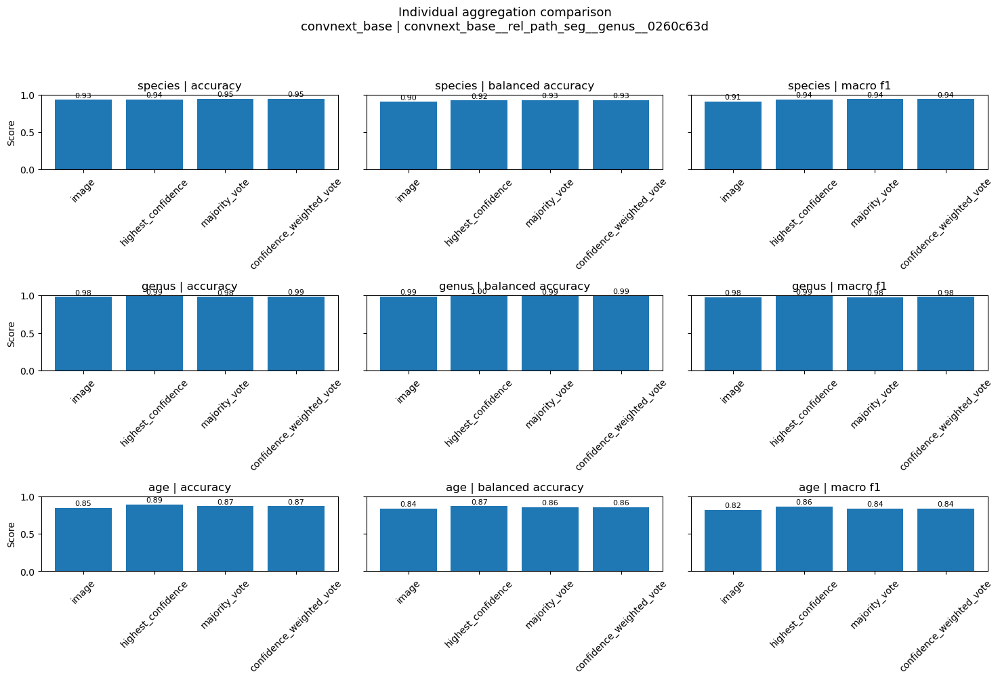

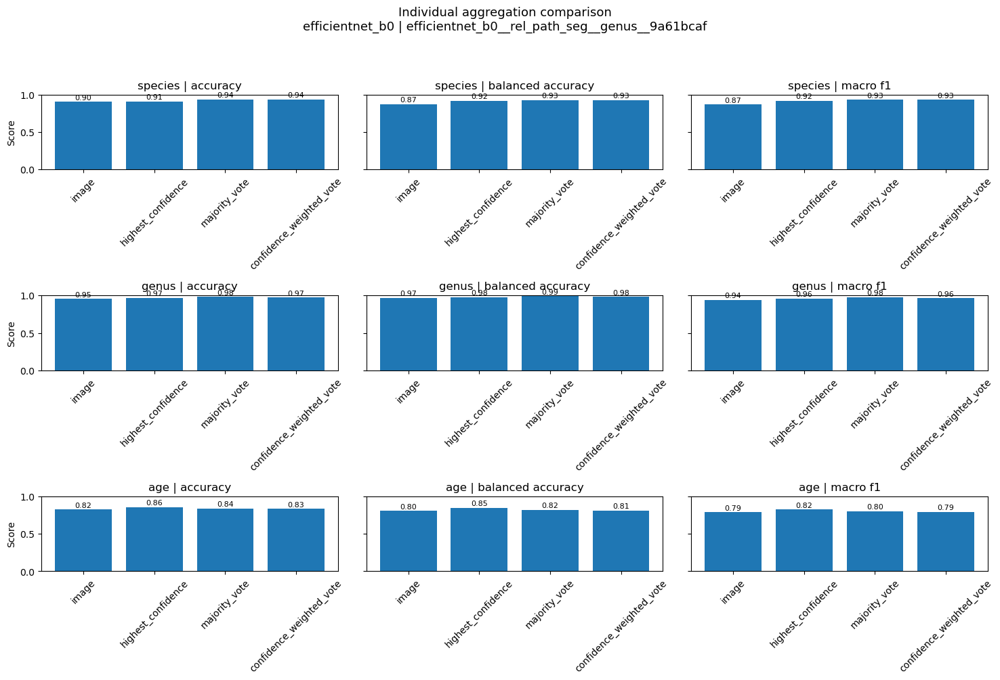

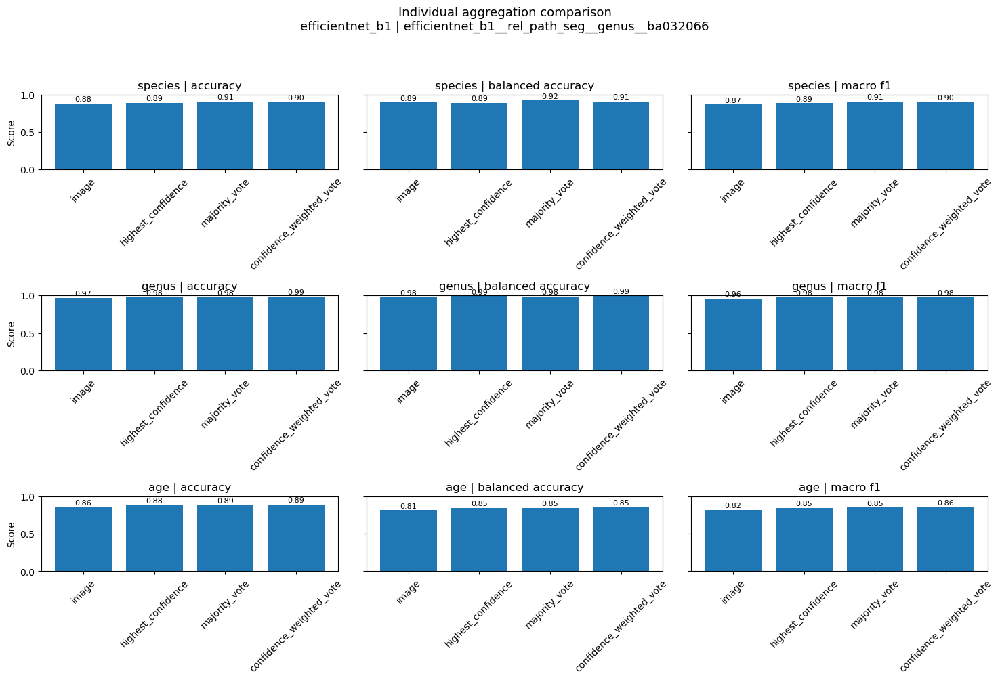

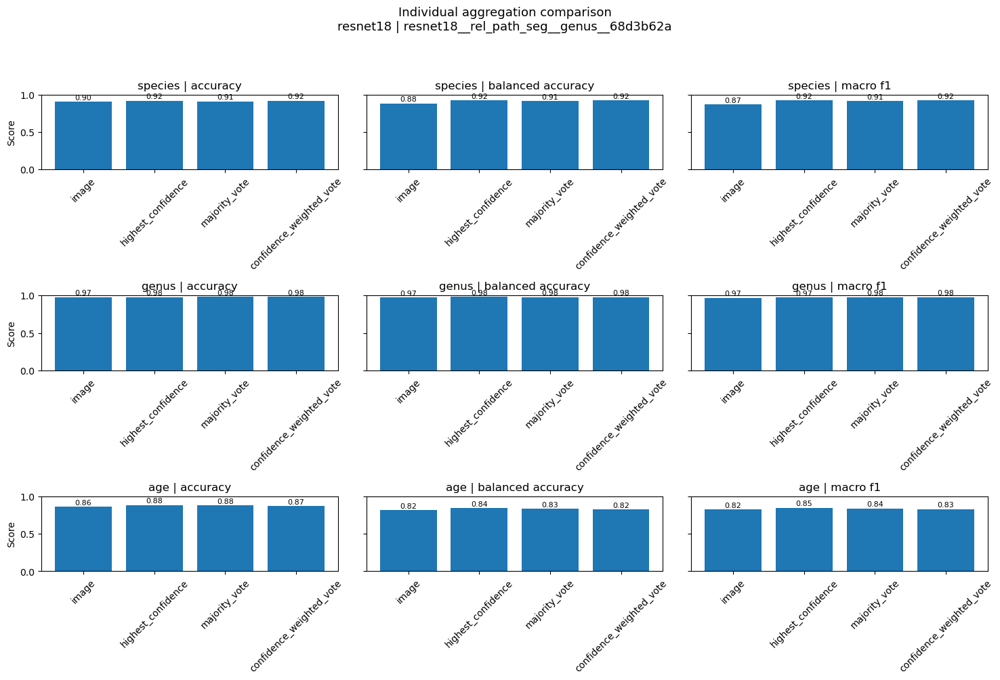

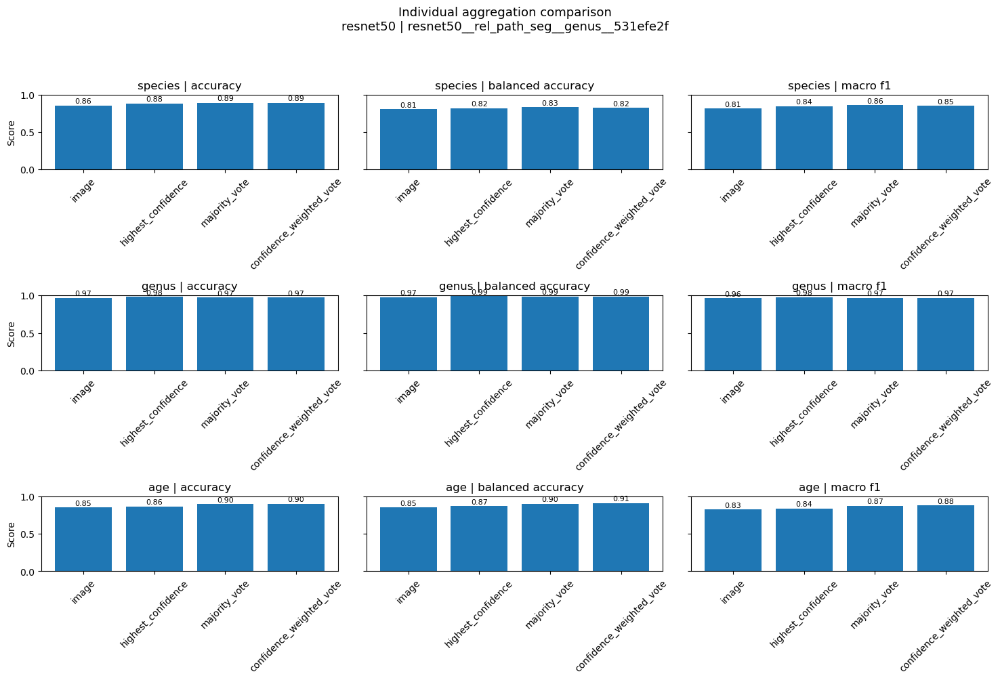

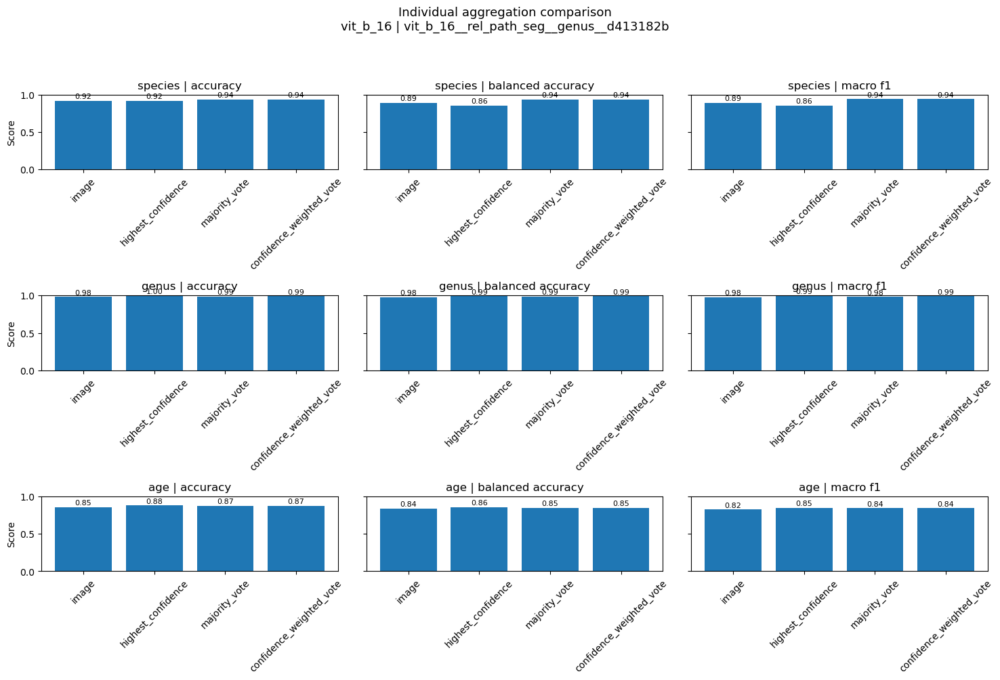

Saved aggregation plots:
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/01_individual_aggregation_comparison/convnext_base__convnext_base__rel_path_seg__genus__0260c63d/aggregation_comparison_bars.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/01_individual_aggregation_comparison/efficientnet_b0__efficientnet_b0__rel_path_seg__genus__9a61bcaf/aggregation_comparison_bars.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/01_individual_aggregation_comparison/efficientnet_b1__efficientnet_b1__rel_path_seg__genus__ba032066/aggregation_comparison_bars.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/a

In [7]:
def plot_aggregation_comparison_for_model(scores_df, model_type, run_name, out_dir):
    sub = scores_df[
        (scores_df["model_type"] == model_type)
        & (scores_df["run_name"] == run_name)
    ].copy()

    sub["method_label"] = np.where(
        sub["level"] == "image",
        "image",
        sub["aggregation"].astype(str),
    )

    methods = ["image"] + AGG_METHODS
    metrics = ["accuracy", "balanced_accuracy", "macro_f1"]

    fig, axes = plt.subplots(
        len(TASKS),
        len(metrics),
        figsize=(5.0 * len(metrics), 3.4 * len(TASKS)),
        squeeze=False,
        sharey=True,
    )

    for row_i, task in enumerate(TASKS):
        task_df = sub[sub["task"] == task].copy()

        for col_i, metric in enumerate(metrics):
            ax = axes[row_i, col_i]

            plot_df = (
                task_df[["method_label", metric]]
                .dropna()
                .drop_duplicates(subset=["method_label"])
                .set_index("method_label")
                .reindex(methods)
                .reset_index()
            )

            ax.bar(plot_df["method_label"], plot_df[metric])
            ax.set_ylim(0, 1)
            ax.set_title(f"{task} | {metric.replace('_', ' ')}")
            ax.tick_params(axis="x", rotation=45)

            for x_i, value in enumerate(plot_df[metric]):
                if pd.notna(value):
                    ax.text(x_i, value + 0.01, f"{value:.2f}", ha="center", va="bottom", fontsize=8)

            if col_i == 0:
                ax.set_ylabel("Score")

    fig.suptitle(f"Individual aggregation comparison\n{model_type} | {run_name}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    path = out_dir / "aggregation_comparison_bars.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


agg_plot_paths = []

for (model_type, run_name), _ in aggregation_comparison_scores.groupby(["model_type", "run_name"], dropna=False):
    model_dir = AGG_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)

    agg_plot_paths.append(
        plot_aggregation_comparison_for_model(
            aggregation_comparison_scores,
            model_type,
            run_name,
            model_dir,
        )
    )

print("Saved aggregation plots:")
for p in agg_plot_paths:
    print(p)


# 3. Confidence calibration

In [8]:
CAL_DIR = ADVANCED_DIR / "03_confidence_calibration"
CAL_DIR.mkdir(parents=True, exist_ok=True)


def calibration_table(pred_df: pd.DataFrame, task: str, n_bins: int = 10) -> pd.DataFrame:
    prob_col = f"{task}_prob"
    correct_col = f"{task}_correct"

    if prob_col not in pred_df.columns or correct_col not in pred_df.columns:
        return pd.DataFrame()

    df = valid_for_task(pred_df, task)
    df = df[df[prob_col].notna() & df[correct_col].notna()].copy()

    if len(df) == 0:
        return pd.DataFrame()

    df[prob_col] = df[prob_col].astype(float)
    df[correct_col] = df[correct_col].astype(bool)

    bins = np.linspace(0, 1, n_bins + 1)
    df["confidence_bin"] = pd.cut(df[prob_col], bins=bins, include_lowest=True, right=True)

    rows = []
    for interval, group in df.groupby("confidence_bin", observed=False):
        if len(group) == 0:
            continue
        mean_conf = float(group[prob_col].mean())
        acc = float(group[correct_col].mean())
        rows.append({
            "bin": str(interval),
            "bin_left": float(interval.left),
            "bin_right": float(interval.right),
            "bin_mid": float((interval.left + interval.right) / 2),
            "n": int(len(group)),
            "mean_confidence": mean_conf,
            "accuracy": acc,
            "abs_gap": abs(acc - mean_conf),
        })

    out = pd.DataFrame(rows)
    if len(out):
        out["weight"] = out["n"] / out["n"].sum()
        out["ece_contribution"] = out["weight"] * out["abs_gap"]
    return out


calibration_tables = {}
calibration_summary_rows = []

for (model_type, run_name), model_df in test_predictions.groupby(["model_type", "run_name"], dropna=False):
    for task in TASKS:
        tab = calibration_table(model_df, task, n_bins=10)
        if len(tab) == 0:
            continue

        tab = tab.copy()
        tab["model_type"] = model_type
        tab["run_name"] = run_name
        tab["task"] = task
        calibration_tables[(model_type, run_name, task)] = tab

        calibration_summary_rows.append({
            "model_type": model_type,
            "run_name": run_name,
            "task": task,
            "n": int(tab["n"].sum()),
            "ece": float(tab["ece_contribution"].sum()),
            "mean_confidence": float((tab["mean_confidence"] * tab["n"]).sum() / tab["n"].sum()),
            "accuracy": float((tab["accuracy"] * tab["n"]).sum() / tab["n"].sum()),
        })

calibration_summary = pd.DataFrame(calibration_summary_rows)
all_calibration_bins = pd.concat(calibration_tables.values(), ignore_index=True) if calibration_tables else pd.DataFrame()

calibration_summary_path = CAL_DIR / "calibration_summary_ece.csv"
calibration_bins_path = CAL_DIR / "calibration_bins_all_models_tasks.csv"

calibration_summary.to_csv(calibration_summary_path, index=False)
all_calibration_bins.to_csv(calibration_bins_path, index=False)

print("Saved:", calibration_summary_path)
print("Saved:", calibration_bins_path)
display(calibration_summary.sort_values("ece", ascending=False))


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/calibration_summary_ece.csv
Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/calibration_bins_all_models_tasks.csv


,model_type,run_name,task,n,ece,mean_confidence,accuracy
14,resnet50,resnet50__rel_path_seg__genus__531efe2f,age,1256,0.104589,0.946988,0.850318
12,resnet50,resnet50__rel_path_seg__genus__531efe2f,species,646,0.103847,0.957988,0.856037
17,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,age,1256,0.101015,0.954518,0.853503
2,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,age,1256,0.099411,0.946545,0.847134
11,resnet18,resnet18__rel_path_seg__genus__68d3b62a,age,1256,0.093739,0.953164,0.859873
8,efficientnet_b1,efficientnet_b1__rel_path_seg__genus__ba032066,age,1256,0.069037,0.920373,0.855096
5,efficientnet_b0,efficientnet_b0__rel_path_seg__genus__9a61bcaf,age,1256,0.067477,0.889929,0.822452
6,efficientnet_b1,efficientnet_b1__rel_path_seg__genus__ba032066,species,646,0.056769,0.939122,0.882353
9,resnet18,resnet18__rel_path_seg__genus__68d3b62a,species,646,0.052810,0.954119,0.902477
15,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,species,646,0.049261,0.967217,0.917957


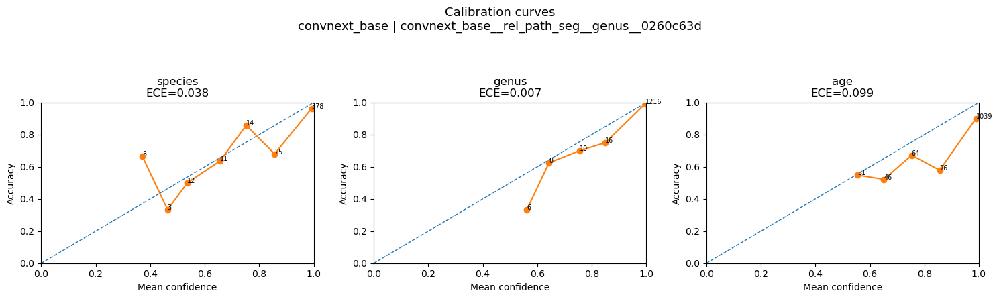

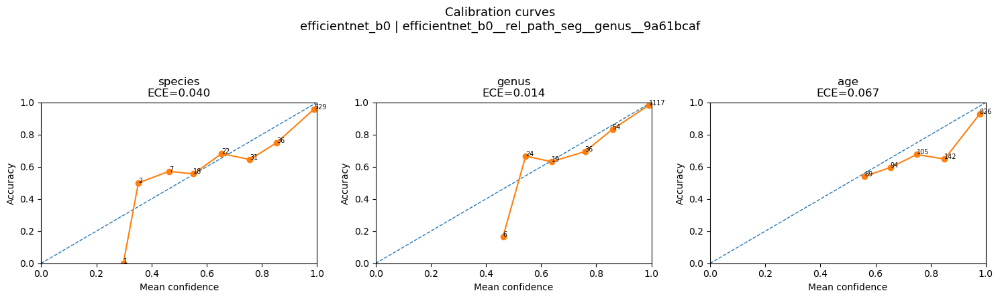

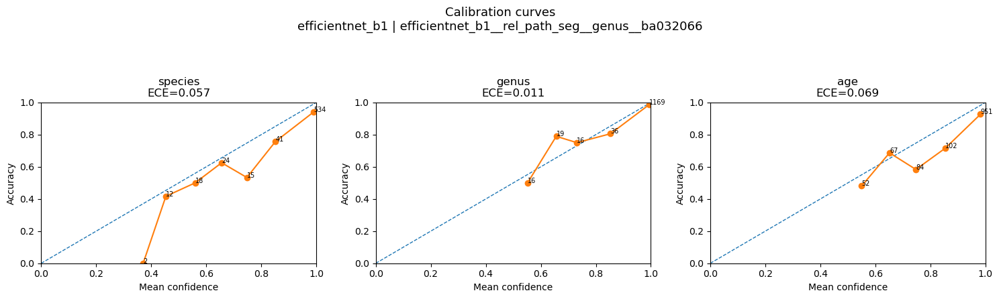

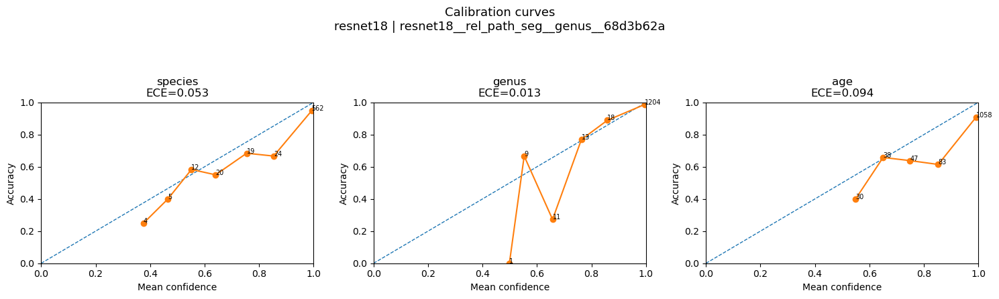

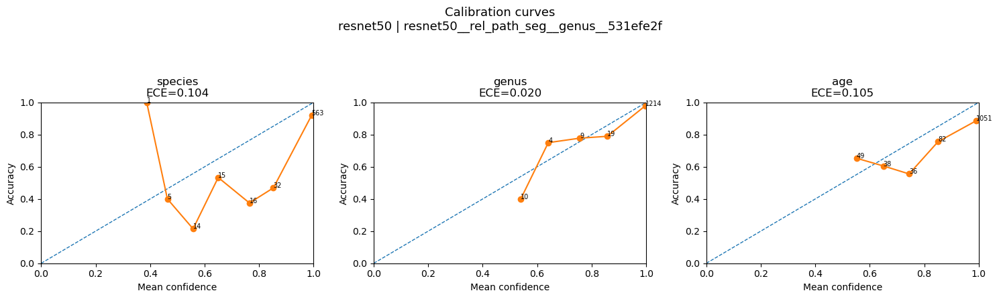

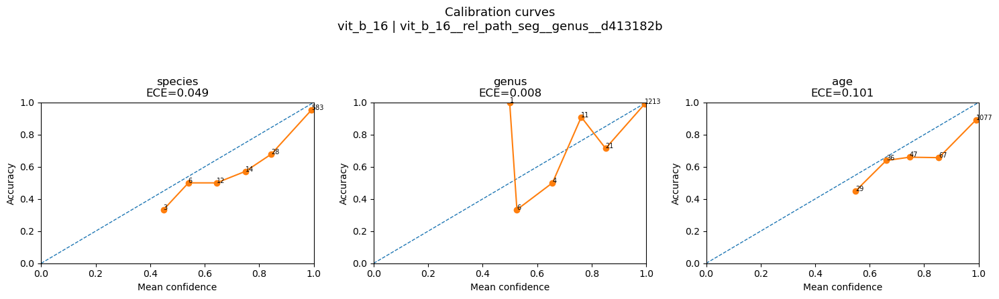

Saved calibration plots:
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/convnext_base__convnext_base__rel_path_seg__genus__0260c63d/calibration_curves.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/efficientnet_b0__efficientnet_b0__rel_path_seg__genus__9a61bcaf/calibration_curves.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/efficientnet_b1__efficientnet_b1__rel_path_seg__genus__ba032066/calibration_curves.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/03_confidence_calibration/resnet18__resn

In [9]:
def plot_calibration_curves_for_model(tables, model_type, run_name, out_dir):
    fig, axes = plt.subplots(1, len(TASKS), figsize=(5 * len(TASKS), 4.5), squeeze=False)
    axes = axes[0]

    for ax, task in zip(axes, TASKS):
        key = (model_type, run_name, task)

        if key not in tables:
            ax.axis("off")
            ax.set_title(f"{task}\nno data")
            continue

        tab = tables[key]
        ece = tab["ece_contribution"].sum()

        ax.plot([0, 1], [0, 1], linestyle="--", linewidth=1)
        ax.plot(tab["mean_confidence"], tab["accuracy"], marker="o")

        for _, row in tab.iterrows():
            ax.text(row["mean_confidence"], row["accuracy"], str(int(row["n"])), fontsize=7)

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_xlabel("Mean confidence")
        ax.set_ylabel("Accuracy")
        ax.set_title(f"{task}\nECE={ece:.3f}")

    fig.suptitle(f"Calibration curves\n{model_type} | {run_name}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.90])

    path = out_dir / "calibration_curves.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


calibration_plot_paths = []

for (model_type, run_name), _ in test_predictions.groupby(["model_type", "run_name"], dropna=False):
    model_dir = CAL_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)

    calibration_plot_paths.append(
        plot_calibration_curves_for_model(calibration_tables, model_type, run_name, model_dir)
    )

print("Saved calibration plots:")
for p in calibration_plot_paths:
    print(p)


# 5. Individual prediction stability

In [10]:
STAB_DIR = ADVANCED_DIR / "05_individual_prediction_stability"
STAB_DIR.mkdir(parents=True, exist_ok=True)


def individual_stability_table(pred_df: pd.DataFrame) -> pd.DataFrame:
    rows = []

    for (model_type, run_name, group_id), group in pred_df.groupby(
        ["model_type", "run_name", "group_id"],
        dropna=False,
    ):
        for task in TASKS:
            g = valid_for_task(group, task)
            pred_col = f"{task}_pred"
            prob_col = f"{task}_prob"
            true_col = f"{task}_true"

            if len(g) == 0:
                continue

            preds = g[pred_col].dropna().astype(str)
            counts = preds.value_counts()

            true_values = g[true_col].dropna().astype(str).unique()
            true_label = true_values[0] if len(true_values) else None
            majority_pred = counts.index[0]

            rows.append({
                "model_type": model_type,
                "run_name": run_name,
                "group_id": group_id,
                "task": task,
                "true_label": true_label,
                "majority_pred": majority_pred,
                "majority_correct": bool(str(true_label) == str(majority_pred)) if true_label is not None else np.nan,
                "n_images": len(g),
                "n_unique_predictions": int(counts.shape[0]),
                "vote_fraction": float(counts.iloc[0] / len(g)),
                "entropy": prediction_entropy(preds),
                "normalised_entropy": normalised_entropy(preds),
                "mean_confidence": float(g[prob_col].mean()) if prob_col in g.columns else np.nan,
                "prediction_counts": "; ".join([f"{k}:{v}" for k, v in counts.items()]),
            })

    return pd.DataFrame(rows)


stability_df = individual_stability_table(test_predictions)

stability_path = STAB_DIR / "individual_prediction_stability.csv"
stability_df.to_csv(stability_path, index=False)

print("Saved:", stability_path)
display(stability_df.head())


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/05_individual_prediction_stability/individual_prediction_stability.csv


,model_type,run_name,group_id,task,true_label,majority_pred,majority_correct,n_images,n_unique_predictions,vote_fraction,entropy,normalised_entropy,mean_confidence,prediction_counts
0,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,species,Allolobophora_chlorotica,Allolobophora_chlorotica,True,5,1,1.0,-0.000000,0.000000,0.998649,Allolobophora_chlorotica:5
1,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,genus,Allolobophora,Allolobophora,True,5,1,1.0,-0.000000,0.000000,0.999008,Allolobophora:5
2,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_08,age,Adult,Juvenile,False,5,2,0.8,0.721928,0.721928,0.671315,Juvenile:4; Adult:1
3,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_09,species,Allolobophora_chlorotica,Allolobophora_chlorotica,True,6,1,1.0,-0.000000,0.000000,0.997322,Allolobophora_chlorotica:6
4,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,Allolobophora_chlorotica_Adult_09,genus,Allolobophora,Allolobophora,True,6,1,1.0,-0.000000,0.000000,0.999131,Allolobophora:6


In [11]:
stability_by_label = (
    stability_df
    .groupby(["model_type", "run_name", "task", "true_label"], dropna=False)
    .agg(
        n_individuals=("group_id", "nunique"),
        mean_vote_fraction=("vote_fraction", "mean"),
        median_vote_fraction=("vote_fraction", "median"),
        mean_n_unique_predictions=("n_unique_predictions", "mean"),
        mean_normalised_entropy=("normalised_entropy", "mean"),
        fraction_unstable_vote_lt_075=("vote_fraction", lambda x: (x < 0.75).mean()),
        majority_accuracy=("majority_correct", "mean"),
    )
    .reset_index()
)

stability_by_label_path = STAB_DIR / "stability_by_true_label.csv"
stability_by_label.to_csv(stability_by_label_path, index=False)

print("Saved:", stability_by_label_path)
display(stability_by_label.sort_values("fraction_unstable_vote_lt_075", ascending=False).head(30))


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/05_individual_prediction_stability/stability_by_true_label.csv


,model_type,run_name,task,true_label,n_individuals,mean_vote_fraction,median_vote_fraction,mean_n_unique_predictions,mean_normalised_entropy,fraction_unstable_vote_lt_075,majority_accuracy
11,convnext_base,convnext_base__rel_path_seg__genus__0260c63d,species,Lumbricus_festivus,2,0.800000,0.800000,1.500000,0.485475,0.500000,1.000000
76,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,species,Lumbricus_festivus,2,0.700000,0.700000,2.000000,0.480115,0.500000,1.000000
24,efficientnet_b0,efficientnet_b0__rel_path_seg__genus__9a61bcaf,species,Lumbricus_festivus,2,0.700000,0.700000,2.000000,0.846439,0.500000,1.000000
63,resnet50,resnet50__rel_path_seg__genus__531efe2f,species,Lumbricus_festivus,2,0.700000,0.700000,2.000000,0.480115,0.500000,0.500000
32,efficientnet_b1,efficientnet_b1__rel_path_seg__genus__ba032066,species,Aporrectodea_caliginosa,7,0.857143,1.000000,1.571429,0.365407,0.285714,0.714286
58,resnet50,resnet50__rel_path_seg__genus__531efe2f,species,Aporrectodea_caliginosa,7,0.800000,0.800000,1.857143,0.467008,0.285714,0.571429
26,efficientnet_b1,efficientnet_b1__rel_path_seg__genus__ba032066,age,Adult,58,0.856671,1.000000,1.482759,0.403289,0.275862,0.758621
13,efficientnet_b0,efficientnet_b0__rel_path_seg__genus__9a61bcaf,age,Adult,58,0.864361,1.000000,1.465517,0.386471,0.258621,0.775862
65,vit_b_16,vit_b_16__rel_path_seg__genus__d413182b,age,Adult,58,0.871196,1.000000,1.413793,0.350708,0.241379,0.793103
52,resnet50,resnet50__rel_path_seg__genus__531efe2f,age,Adult,58,0.896846,1.000000,1.362069,0.297302,0.189655,0.913793


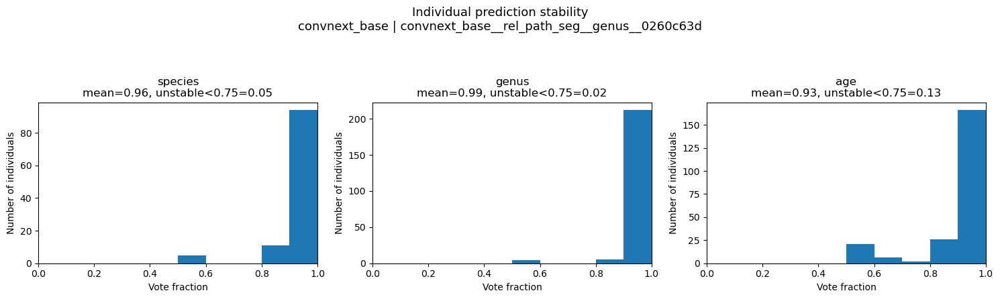

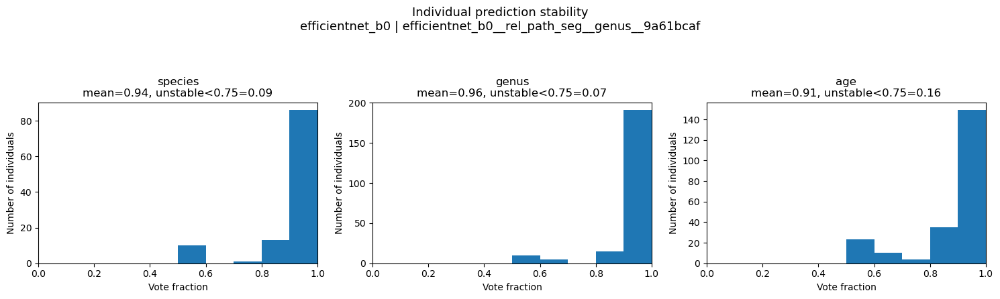

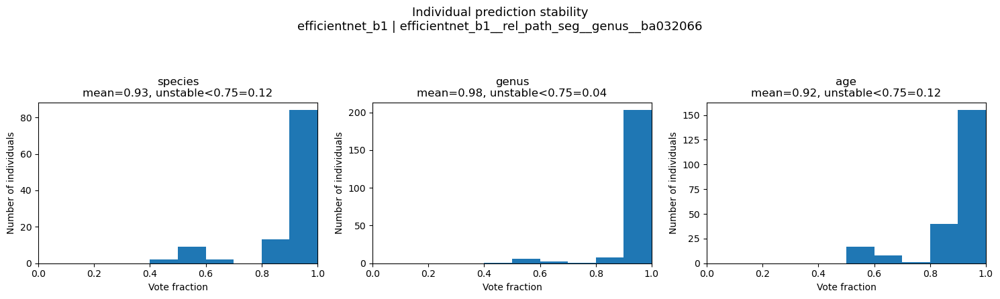

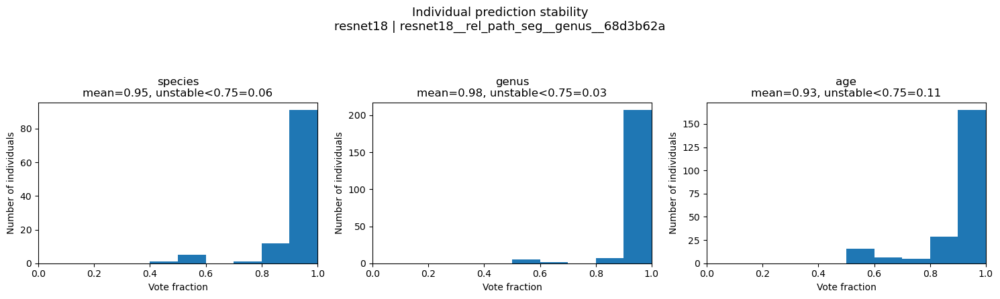

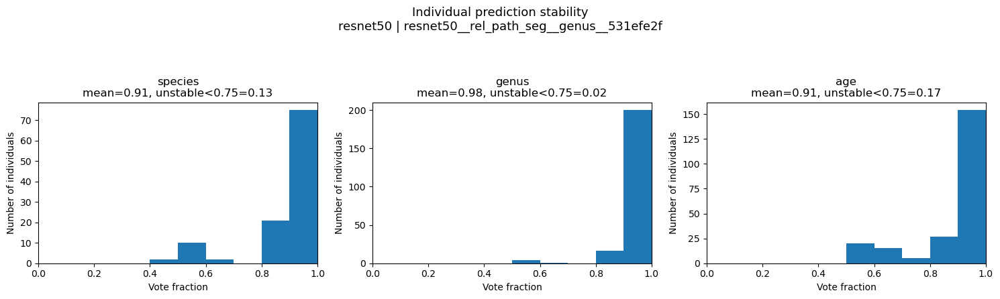

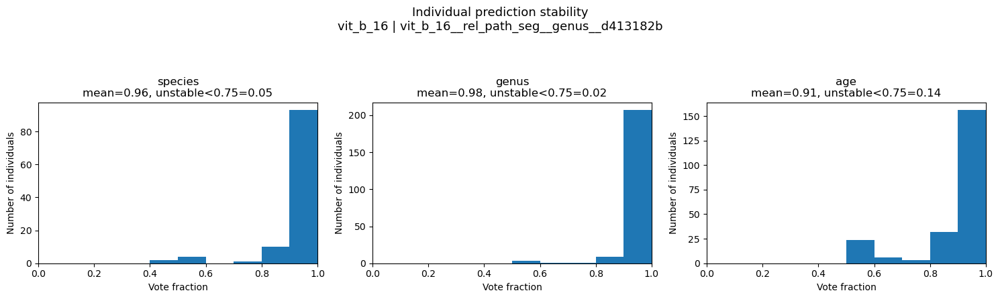

Saved stability plots:
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/05_individual_prediction_stability/convnext_base__convnext_base__rel_path_seg__genus__0260c63d/individual_stability_vote_fraction_histograms.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/05_individual_prediction_stability/efficientnet_b0__efficientnet_b0__rel_path_seg__genus__9a61bcaf/individual_stability_vote_fraction_histograms.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/05_individual_prediction_stability/efficientnet_b1__efficientnet_b1__rel_path_seg__genus__ba032066/individual_stability_vote_fraction_histograms.png
/home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predic

In [12]:
def plot_stability_for_model(stability_df, model_type, run_name, out_dir):
    sub = stability_df[
        (stability_df["model_type"] == model_type)
        & (stability_df["run_name"] == run_name)
    ].copy()

    fig, axes = plt.subplots(1, len(TASKS), figsize=(5 * len(TASKS), 4.5), squeeze=False)
    axes = axes[0]

    for ax, task in zip(axes, TASKS):
        task_df = sub[sub["task"] == task]

        if len(task_df) == 0:
            ax.axis("off")
            ax.set_title(f"{task}\nno data")
            continue

        ax.hist(task_df["vote_fraction"].dropna(), bins=np.linspace(0, 1, 11))
        ax.set_xlim(0, 1)
        ax.set_xlabel("Vote fraction")
        ax.set_ylabel("Number of individuals")
        ax.set_title(
            f"{task}\nmean={task_df['vote_fraction'].mean():.2f}, "
            f"unstable<0.75={(task_df['vote_fraction'] < 0.75).mean():.2f}"
        )

    fig.suptitle(f"Individual prediction stability\n{model_type} | {run_name}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.90])

    path = out_dir / "individual_stability_vote_fraction_histograms.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


stability_plot_paths = []

for (model_type, run_name), _ in stability_df.groupby(["model_type", "run_name"], dropna=False):
    model_dir = STAB_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)
    stability_plot_paths.append(plot_stability_for_model(stability_df, model_type, run_name, model_dir))

print("Saved stability plots:")
for p in stability_plot_paths:
    print(p)


# 6. Model-family agreement categories

In [13]:
AGREE_DIR = ADVANCED_DIR / "06_model_family_agreement"
AGREE_DIR.mkdir(parents=True, exist_ok=True)


def agreement_categories_image_level(pred_df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    index_cols = ["image_path", "image_name", "group_id"]

    for task in TASKS:
        pred_col = f"{task}_pred"
        correct_col = f"{task}_correct"
        true_col = f"{task}_true"

        df = valid_for_task(pred_df, task)

        for keys, group in df.groupby(index_cols, dropna=False):
            preds = group[pred_col].dropna().astype(str)
            correct = group[correct_col].dropna()

            if len(preds) == 0:
                continue

            true_values = group[true_col].dropna().astype(str).unique()
            true_label = true_values[0] if len(true_values) else None

            n_models = len(preds)
            n_unique = preds.nunique()
            all_agree = n_unique == 1

            any_correct = bool(correct.astype(bool).any()) if len(correct) else False
            all_correct = bool(correct.astype(bool).all()) if len(correct) else False

            if all_agree and all_correct:
                category = "all_agree_correct"
            elif all_agree and not any_correct:
                category = "all_agree_wrong"
            elif (not all_agree) and any_correct:
                category = "disagree_at_least_one_correct"
            elif (not all_agree) and not any_correct:
                category = "disagree_none_correct"
            else:
                category = "other"

            pred_counts = preds.value_counts()

            rows.append({
                "task": task,
                "image_path": keys[0],
                "image_name": keys[1],
                "group_id": keys[2],
                "true_label": true_label,
                "n_models": n_models,
                "n_unique_predictions": int(n_unique),
                "all_models_agree": all_agree,
                "any_model_correct": any_correct,
                "all_models_correct": all_correct,
                "agreement_category": category,
                "consensus_pred": pred_counts.index[0],
                "consensus_fraction": float(pred_counts.iloc[0] / n_models),
                "prediction_counts": "; ".join([f"{k}:{v}" for k, v in pred_counts.items()]),
            })

    return pd.DataFrame(rows)


agreement_image_df = agreement_categories_image_level(test_predictions)

agreement_image_path = AGREE_DIR / "model_family_agreement_categories_image_level.csv"
agreement_image_df.to_csv(agreement_image_path, index=False)

agreement_summary = (
    agreement_image_df
    .groupby(["task", "agreement_category"])
    .size()
    .reset_index(name="n_images")
)
agreement_summary["fraction"] = agreement_summary.groupby("task")["n_images"].transform(lambda x: x / x.sum())

agreement_summary_path = AGREE_DIR / "model_family_agreement_summary_image_level.csv"
agreement_summary.to_csv(agreement_summary_path, index=False)

print("Saved:", agreement_image_path)
print("Saved:", agreement_summary_path)
display(agreement_summary)


Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/06_model_family_agreement/model_family_agreement_categories_image_level.csv
Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/06_model_family_agreement/model_family_agreement_summary_image_level.csv


,task,agreement_category,n_images,fraction
0,age,all_agree_correct,795,0.632962
1,age,all_agree_wrong,30,0.023885
2,age,disagree_at_least_one_correct,431,0.343153
3,genus,all_agree_correct,1132,0.901274
4,genus,all_agree_wrong,1,0.000796
5,genus,disagree_at_least_one_correct,123,0.097930
6,species,all_agree_correct,501,0.775542
7,species,all_agree_wrong,14,0.021672
8,species,disagree_at_least_one_correct,124,0.191950
9,species,disagree_none_correct,7,0.010836


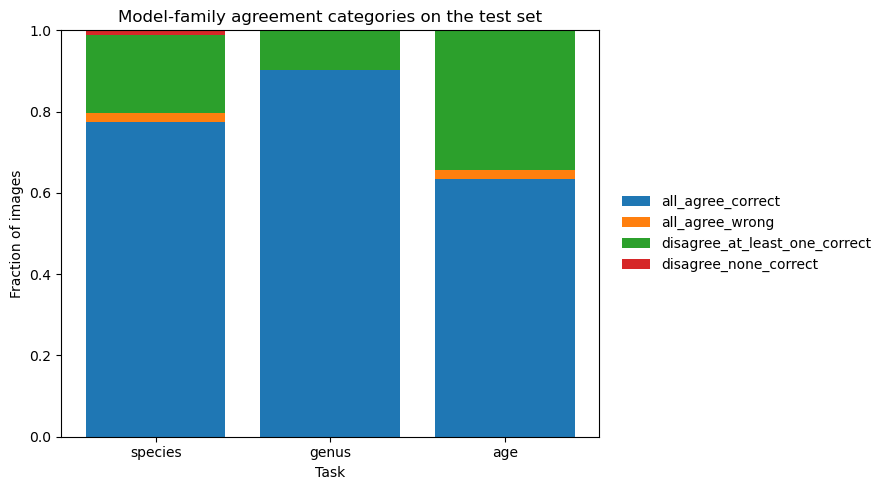

Saved: /home/devd/worm-species/outputs_slurm/combined_sweep_analysis/same_individual_predictions_top_models/test_set_model_disagreement/advanced_diagnostics/06_model_family_agreement/agreement_categories_stacked_bar.png


In [14]:
def plot_agreement_categories(agreement_summary, out_dir):
    categories = [
        "all_agree_correct",
        "all_agree_wrong",
        "disagree_at_least_one_correct",
        "disagree_none_correct",
    ]

    pivot = (
        agreement_summary
        .pivot_table(index="task", columns="agreement_category", values="fraction", aggfunc="sum", fill_value=0)
        .reindex(TASKS)
    )

    for cat in categories:
        if cat not in pivot.columns:
            pivot[cat] = 0.0

    pivot = pivot[categories]
    x = np.arange(len(pivot.index))
    bottom = np.zeros(len(pivot.index))

    fig, ax = plt.subplots(figsize=(9, 5))

    for cat in categories:
        vals = pivot[cat].values
        ax.bar(x, vals, bottom=bottom, label=cat)
        bottom += vals

    ax.set_ylim(0, 1)
    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index)
    ax.set_ylabel("Fraction of images")
    ax.set_xlabel("Task")
    ax.set_title("Model-family agreement categories on the test set")
    ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), frameon=False)

    plt.tight_layout()
    path = out_dir / "agreement_categories_stacked_bar.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


agreement_plot_path = plot_agreement_categories(agreement_summary, AGREE_DIR)
print("Saved:", agreement_plot_path)


# 8. Error image galleries

In [15]:
GALLERY_DIR = ADVANCED_DIR / "08_error_image_galleries"
GALLERY_DIR.mkdir(parents=True, exist_ok=True)


def load_image_for_gallery(path, thumb_size=224):
    try:
        img = Image.open(path).convert("RGB")
        img.thumbnail((thumb_size, thumb_size))
        return img
    except Exception as exc:
        warnings.warn(f"Could not load image {path}: {exc}")
        return None


def plot_image_gallery(df, title, out_path, subtitle_cols, n_images=N_GALLERY_IMAGES, random_state=RANDOM_STATE):
    if len(df) == 0:
        print("No rows for gallery:", title)
        return None

    if len(df) > n_images:
        df = df.sample(n=n_images, random_state=random_state).reset_index(drop=True)
    else:
        df = df.reset_index(drop=True)

    n = len(df)
    n_cols = min(4, n)
    n_rows = int(np.ceil(n / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.2 * n_cols, 4.8 * n_rows), squeeze=False)

    for ax in axes.ravel():
        ax.axis("off")

    for i, (_, row) in enumerate(df.iterrows()):
        ax = axes.ravel()[i]
        img = load_image_for_gallery(row["image_path"])

        if img is None:
            ax.text(0.5, 0.5, "image missing", ha="center", va="center")
            continue

        ax.imshow(img)
        ax.axis("off")

        subtitle = []
        for col in subtitle_cols:
            if col in row.index:
                subtitle.append(f"{col}: {row[col]}")

        ax.set_title("\n".join(subtitle), fontsize=8)

    fig.suptitle(title, fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    out_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(out_path, dpi=220, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return out_path


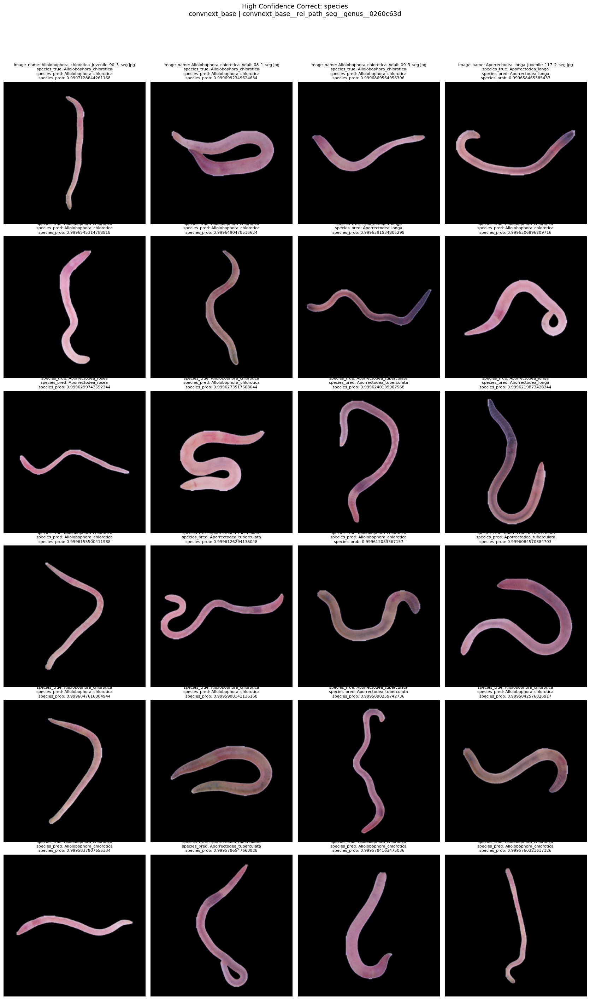

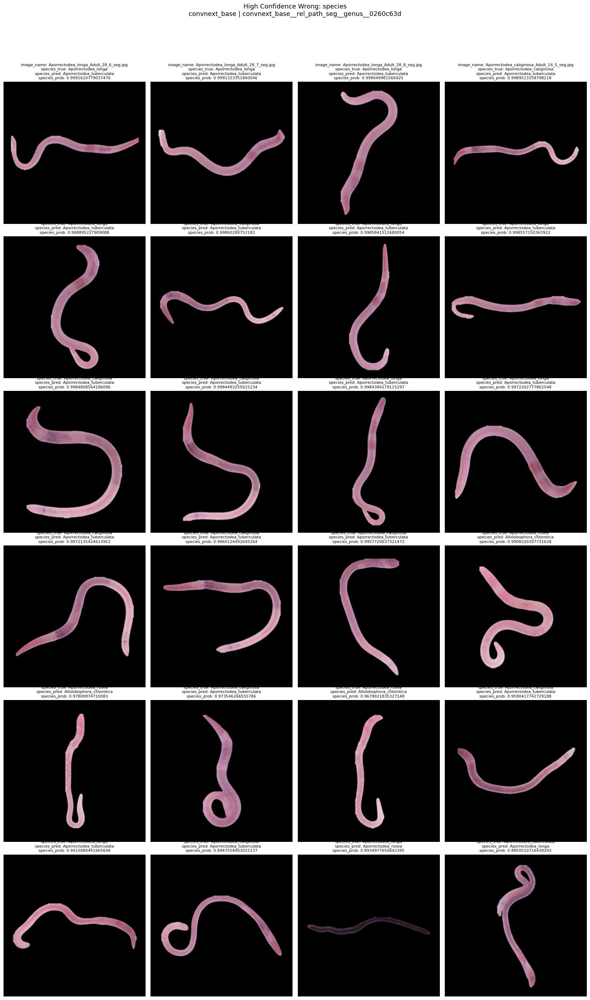

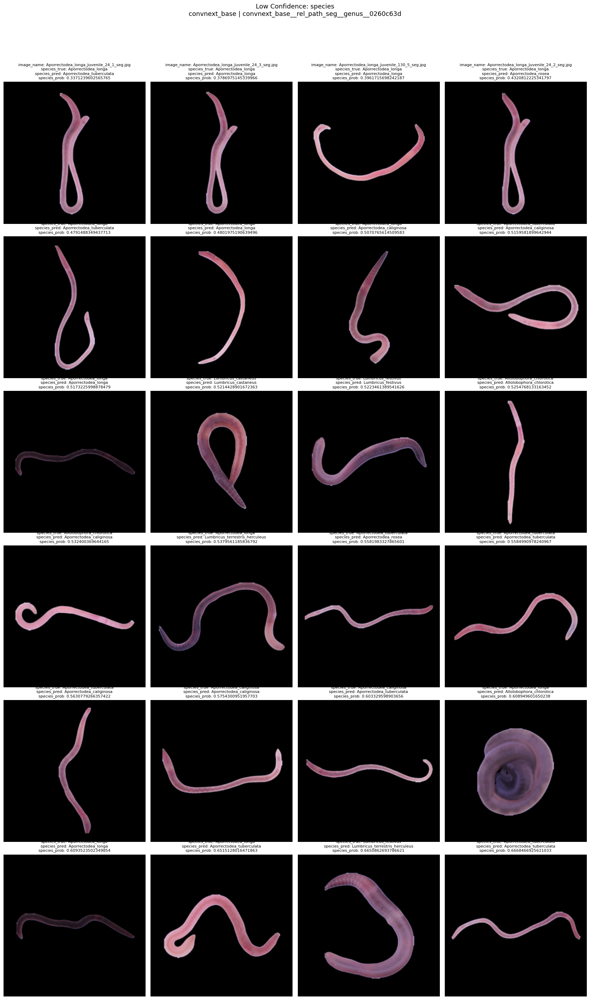

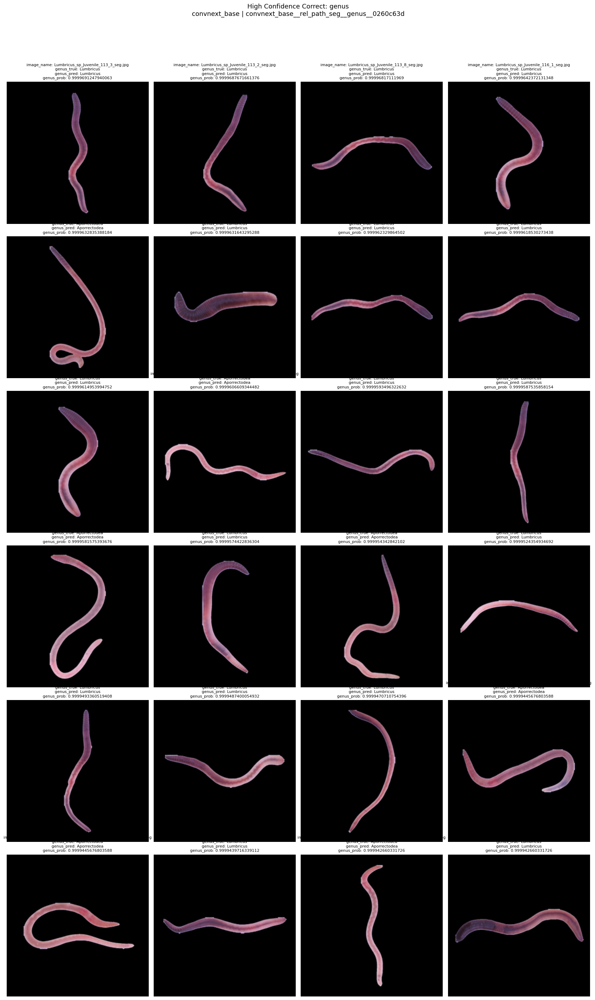

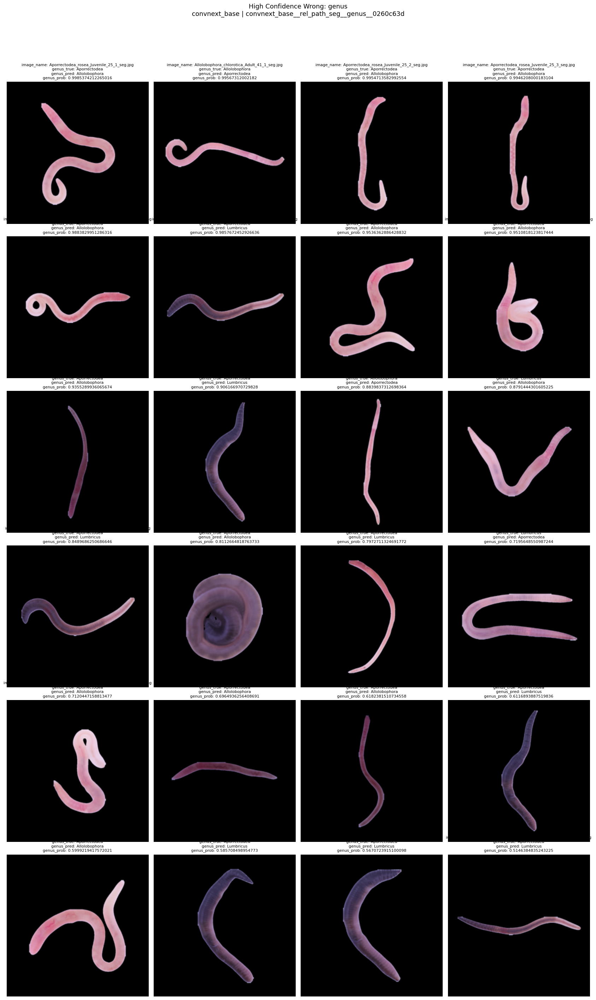

...

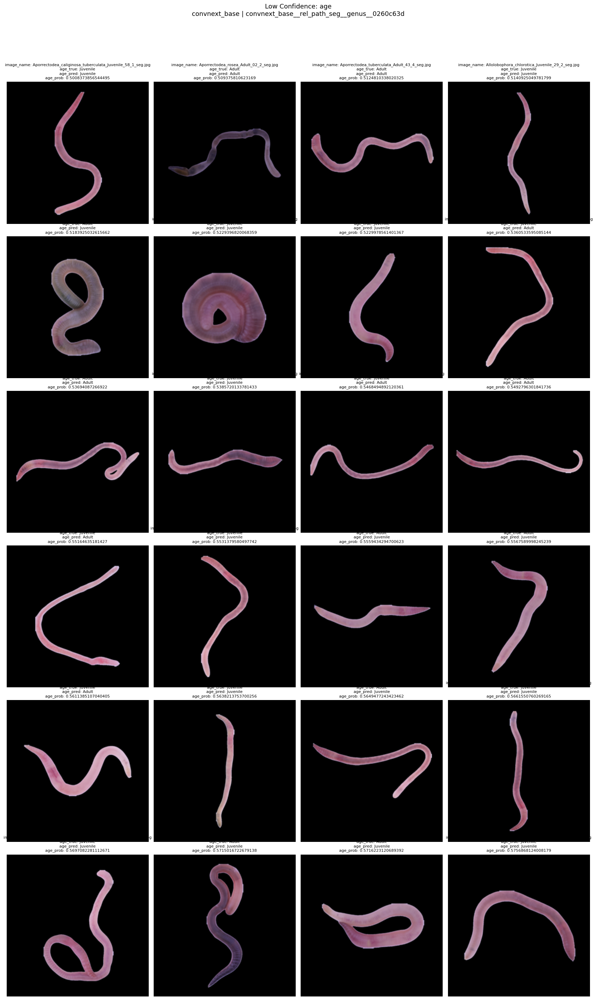

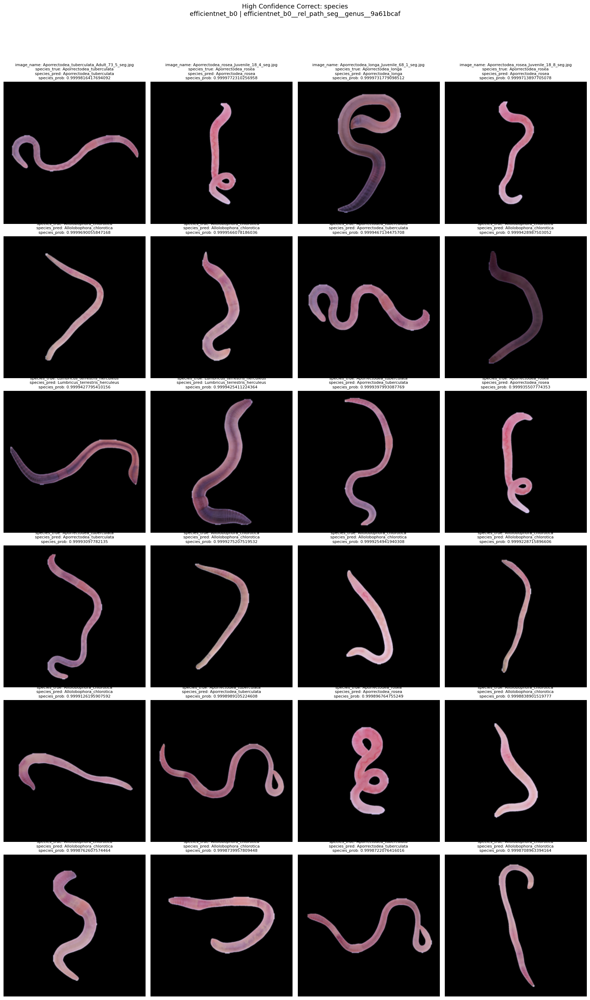

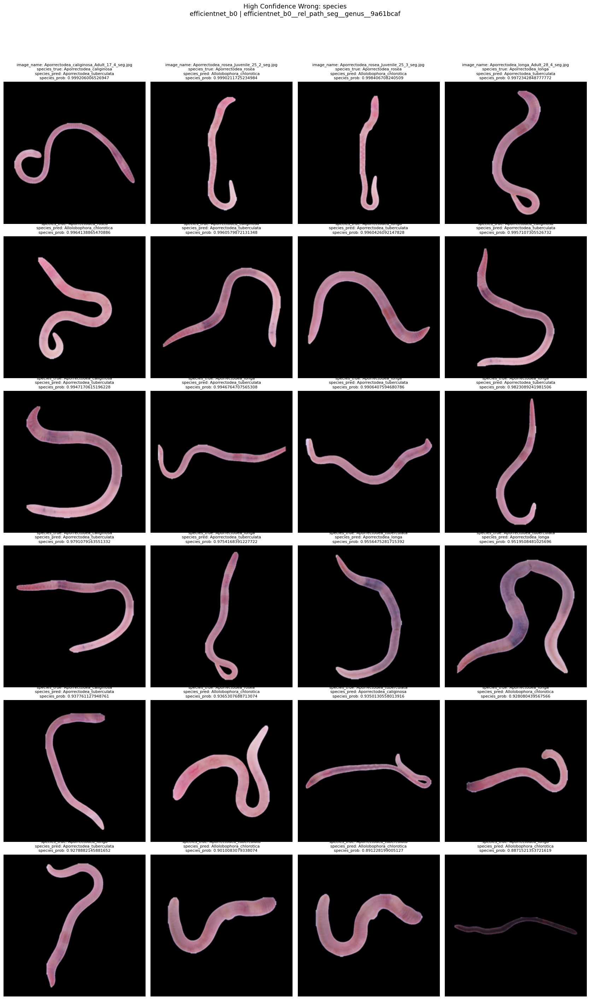

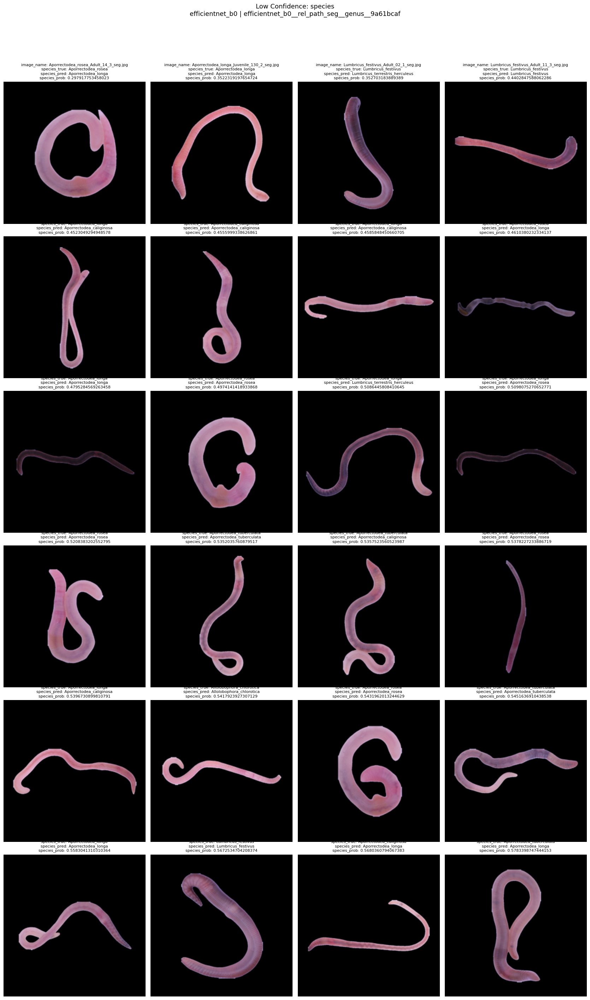

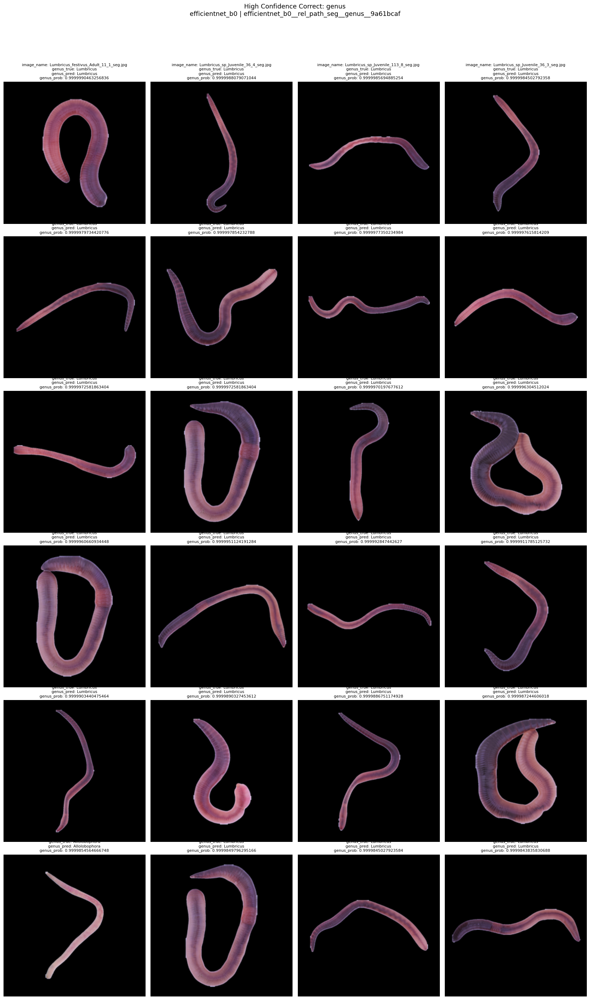

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_67/Aporrectodea_tuberculata_Adult_67_6/Aporrectodea_tuberculata_Adult_67_6_seg.jpg: [Errno 5] Input/output error: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_67/Aporrectodea_tuberculata_Adult_67_6/Aporrectodea_tuberculata_Adult_67_6_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_151/Lumbricus_sp_Juvenile_151_4/Lumbricus_sp_Juvenile_151_4_seg.jpg: [Errno 5] Input/output error: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_151/Lumbricus_sp_Juvenile_151_4/Lumbricus_sp_Juvenile_151_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:

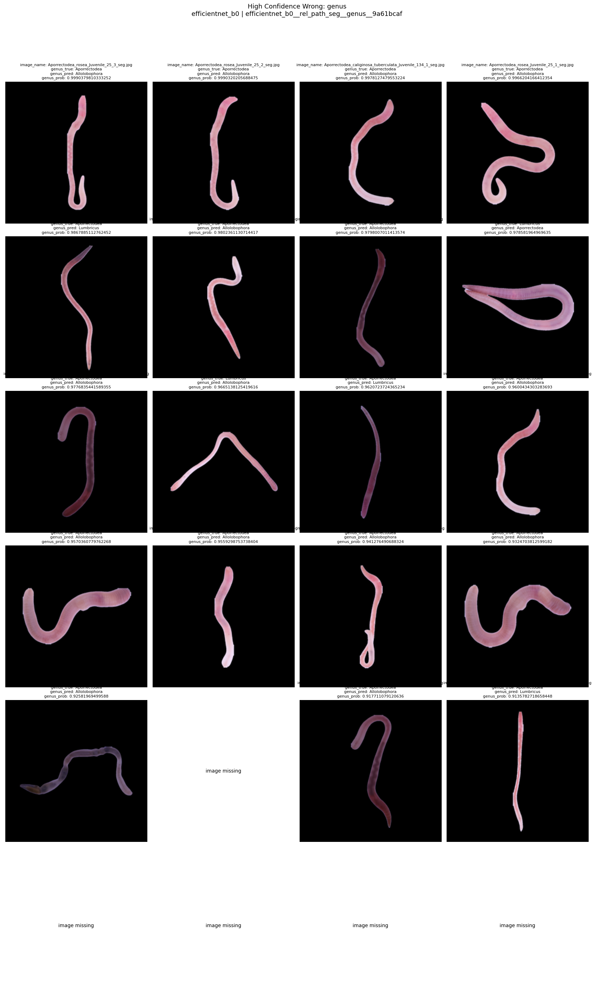

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_252/Aporrectodea_caliginosa_tuberculata_Juvenile_252_4/Aporrectodea_caliginosa_tuberculata_Juvenile_252_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_252/Aporrectodea_caliginosa_tuberculata_Juvenile_252_4/Aporrectodea_caliginosa_tuberculata_Juvenile_252_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_131/Lumbricus_sp_Juvenile_131_6/Lumbricus_sp_Juvenile_131_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_131/Lumbricus_sp_Juvenile_131_6/Lumbricus_sp_Juvenile_13

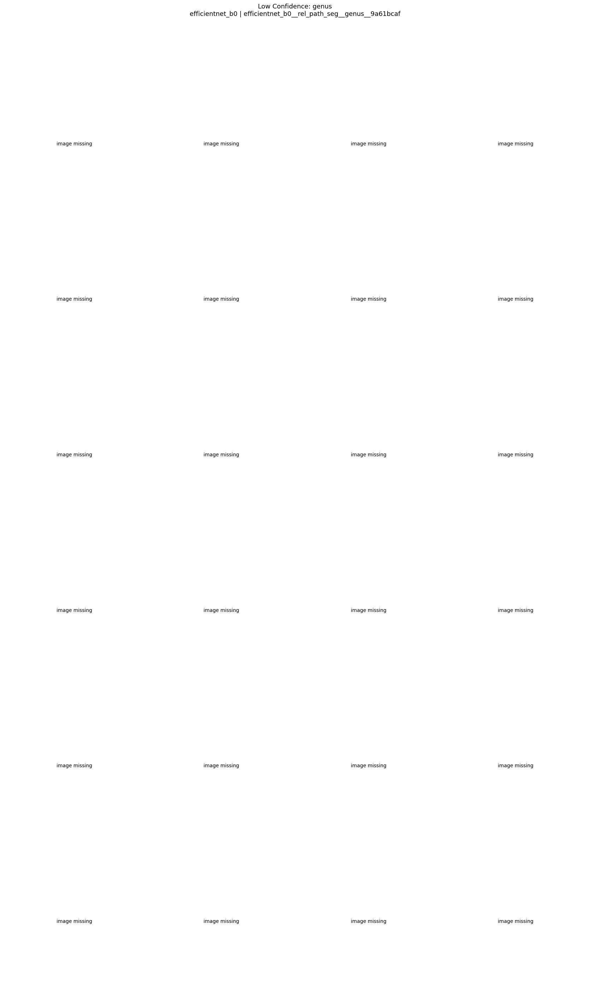

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_299/Aporrectodea_caliginosa_tuberculata_Juvenile_299_1/Aporrectodea_caliginosa_tuberculata_Juvenile_299_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_299/Aporrectodea_caliginosa_tuberculata_Juvenile_299_1/Aporrectodea_caliginosa_tuberculata_Juvenile_299_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_308/Aporrectodea_caliginosa_tuberculata_Juvenile_308_6/Aporrectodea_caliginosa_tuberculata_Juvenile_308_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrecto

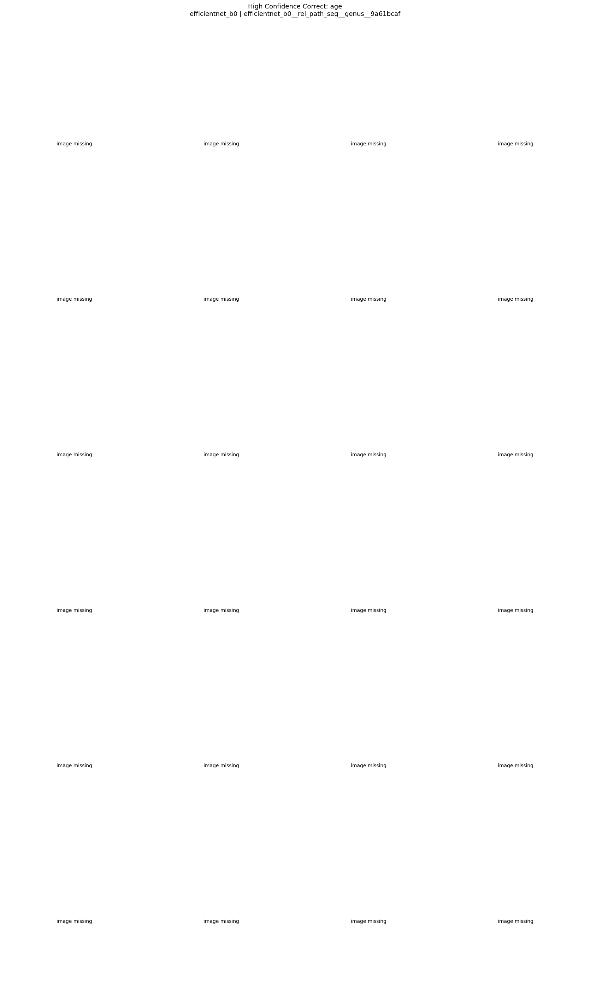

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_63/Aporrectodea_longa_Juvenile_63_2/Aporrectodea_longa_Juvenile_63_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_63/Aporrectodea_longa_Juvenile_63_2/Aporrectodea_longa_Juvenile_63_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_147/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_147/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4/Aporrectodea_cali

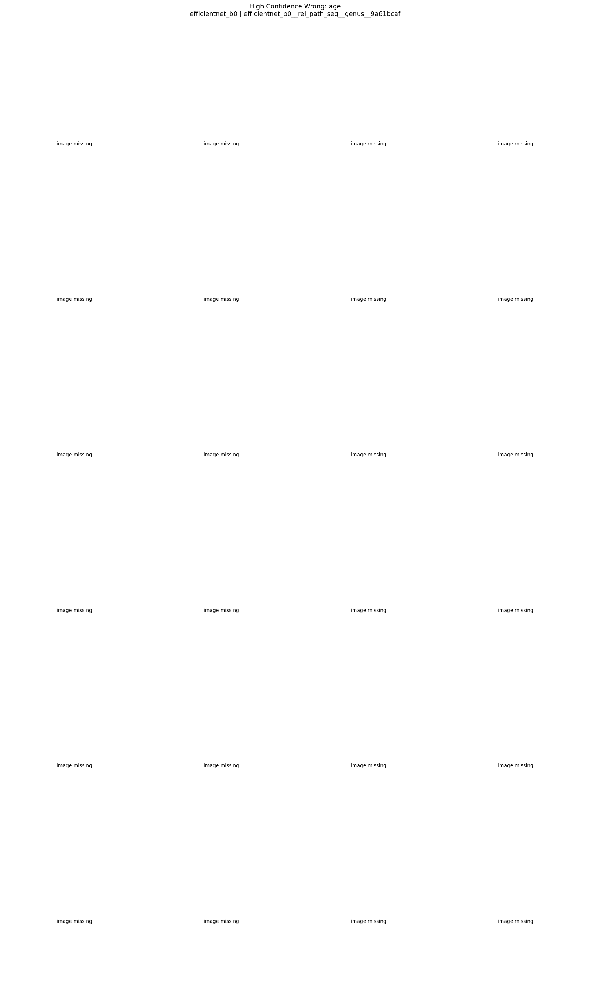

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Adult_24/Allolobophora_chlorotica_Adult_24_2/Allolobophora_chlorotica_Adult_24_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Adult_24/Allolobophora_chlorotica_Adult_24_2/Allolobophora_chlorotica_Adult_24_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_22/Aporrectodea_longa_Adult_22_2/Aporrectodea_longa_Adult_22_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_22/Aporrectodea_longa_Adult_22_2/Aporrectodea_longa_Adult_22_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipyke

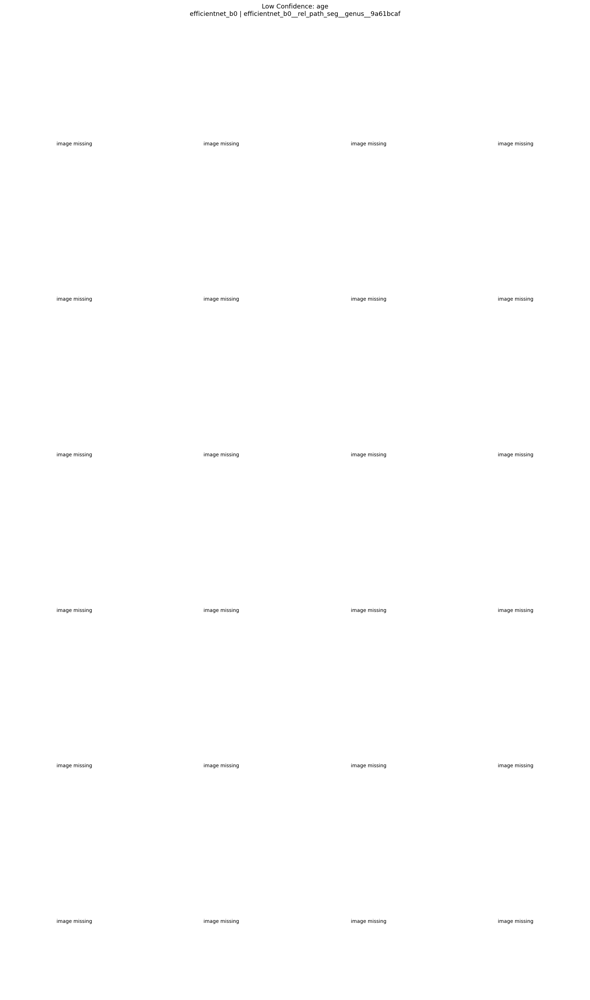

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_109/Aporrectodea_longa_Juvenile_109_2/Aporrectodea_longa_Juvenile_109_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_109/Aporrectodea_longa_Juvenile_109_2/Aporrectodea_longa_Juvenile_109_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_78/Aporrectodea_tuberculata_Adult_78_5/Aporrectodea_tuberculata_Adult_78_5_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_78/Aporrectodea_tuberculata_Adult_78_5/Aporrectodea_tuberculata_Adult_78_5_seg.jpg'
  warnings.warn(f"Could not load image {p

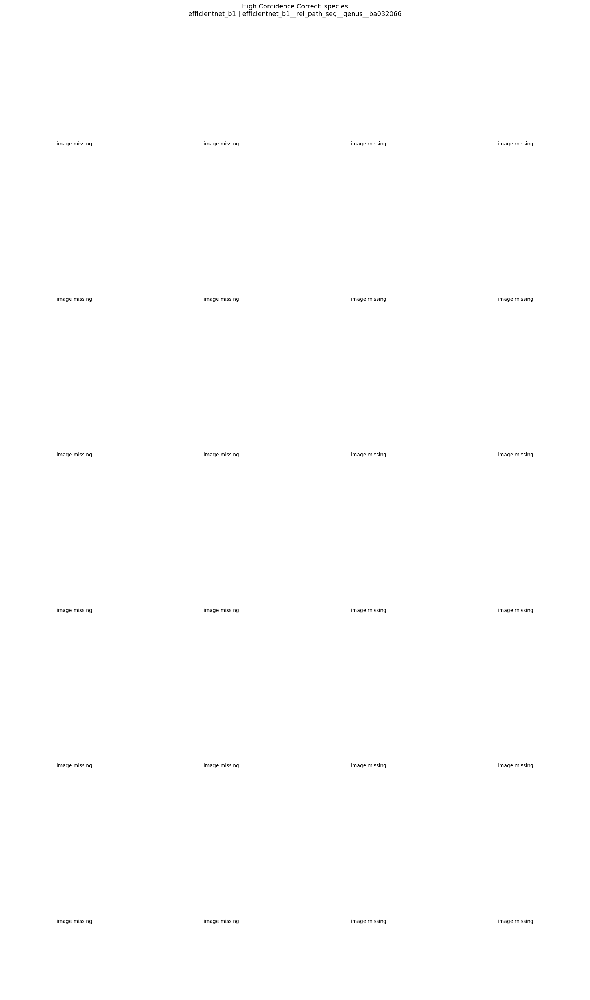

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_28/Aporrectodea_longa_Adult_28_1/Aporrectodea_longa_Adult_28_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_28/Aporrectodea_longa_Adult_28_1/Aporrectodea_longa_Adult_28_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_20/Aporrectodea_tuberculata_Adult_20_1/Aporrectodea_tuberculata_Adult_20_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_20/Aporrectodea_tuberculata_Adult_20_1/Aporrectodea_tuberculata_Adult_20_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipyke

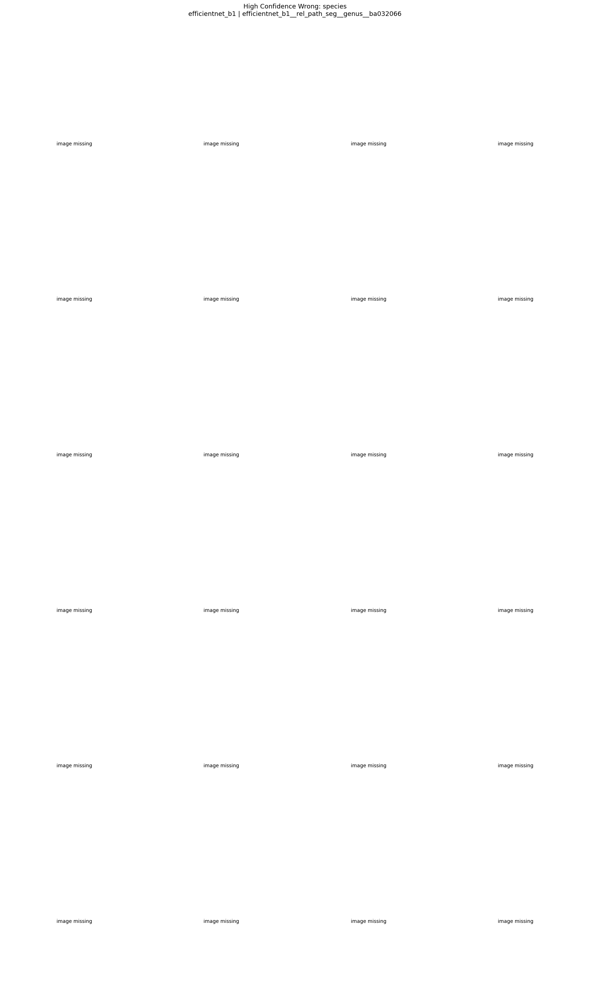

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_130/Aporrectodea_longa_Juvenile_130_6/Aporrectodea_longa_Juvenile_130_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_130/Aporrectodea_longa_Juvenile_130_6/Aporrectodea_longa_Juvenile_130_6_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_36/Aporrectodea_tuberculata_Adult_36_3/Aporrectodea_tuberculata_Adult_36_3_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_36/Aporrectodea_tuberculata_Adult_36_3/Aporrectodea_tuberculata_Adult_36_3_seg.jpg'
  warnings.warn(f"Could not load image {p

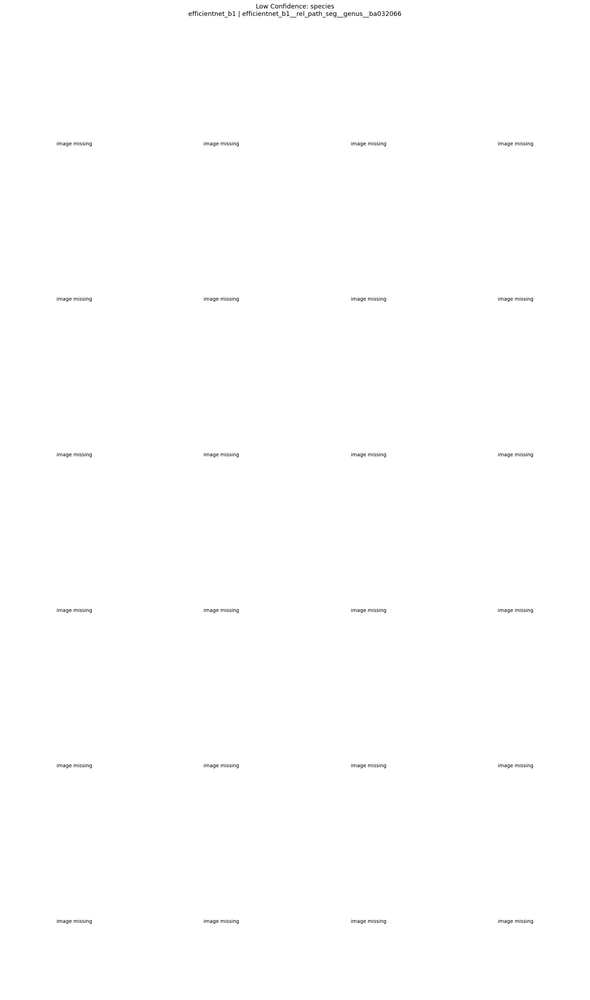

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_46/Lumbricus_sp_Juvenile_46_6/Lumbricus_sp_Juvenile_46_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_46/Lumbricus_sp_Juvenile_46_6/Lumbricus_sp_Juvenile_46_6_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_116/Lumbricus_sp_Juvenile_116_3/Lumbricus_sp_Juvenile_116_3_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_116/Lumbricus_sp_Juvenile_116_3/Lumbricus_sp_Juvenile_116_3_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /m

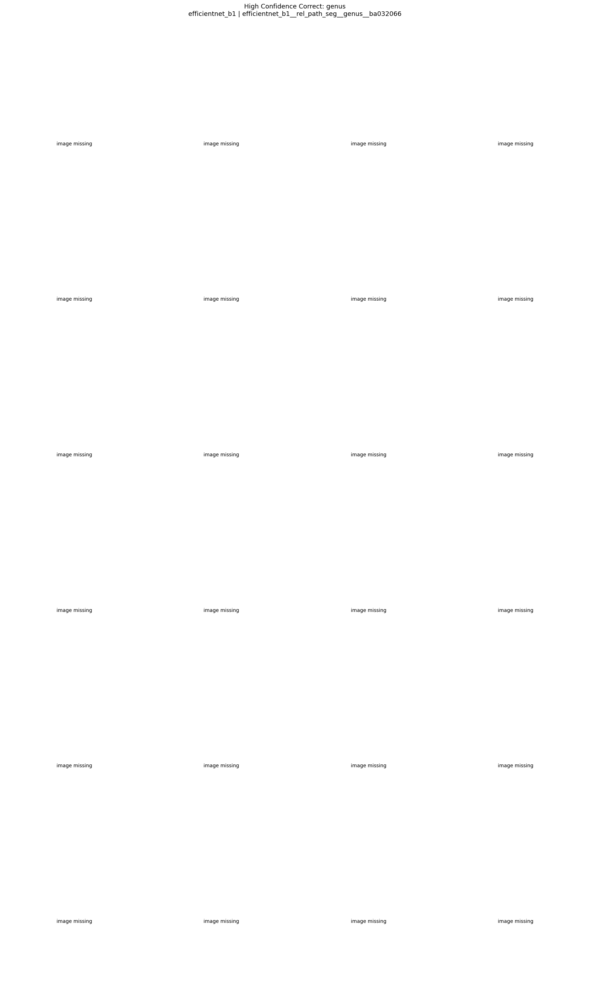

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Juvenile_25/Aporrectodea_rosea_Juvenile_25_1/Aporrectodea_rosea_Juvenile_25_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Juvenile_25/Aporrectodea_rosea_Juvenile_25_1/Aporrectodea_rosea_Juvenile_25_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_02/Aporrectodea_longa_Adult_02_1/Aporrectodea_longa_Adult_02_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Adult_02/Aporrectodea_longa_Adult_02_1/Aporrectodea_longa_Adult_02_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/342014

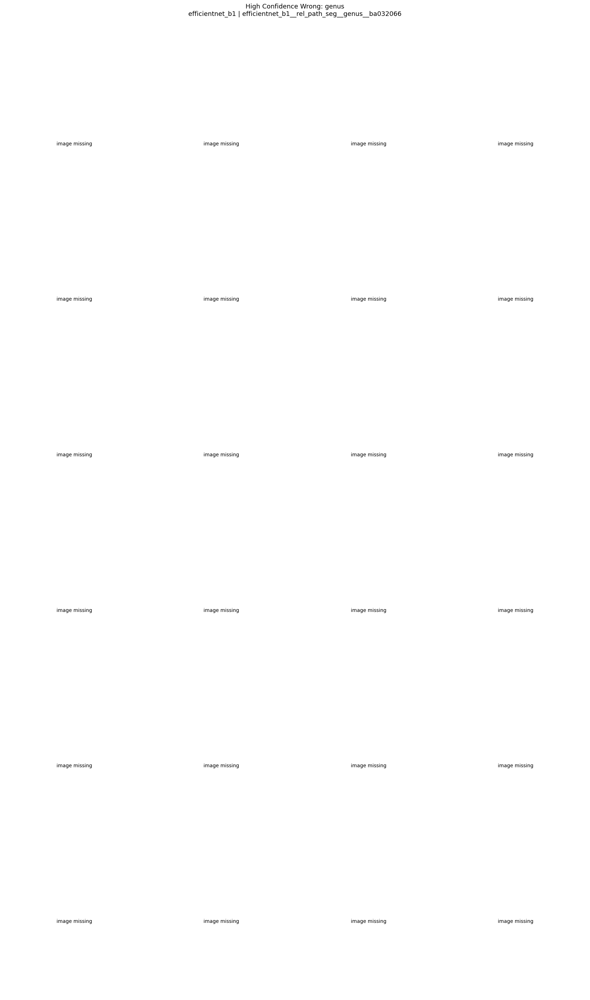

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_374/Aporrectodea_caliginosa_tuberculata_Juvenile_374_3/Aporrectodea_caliginosa_tuberculata_Juvenile_374_3_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_374/Aporrectodea_caliginosa_tuberculata_Juvenile_374_3/Aporrectodea_caliginosa_tuberculata_Juvenile_374_3_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_81/Aporrectodea_longa_Juvenile_81_4/Aporrectodea_longa_Juvenile_81_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_81/Aporrectodea_longa_Juvenile_81_4

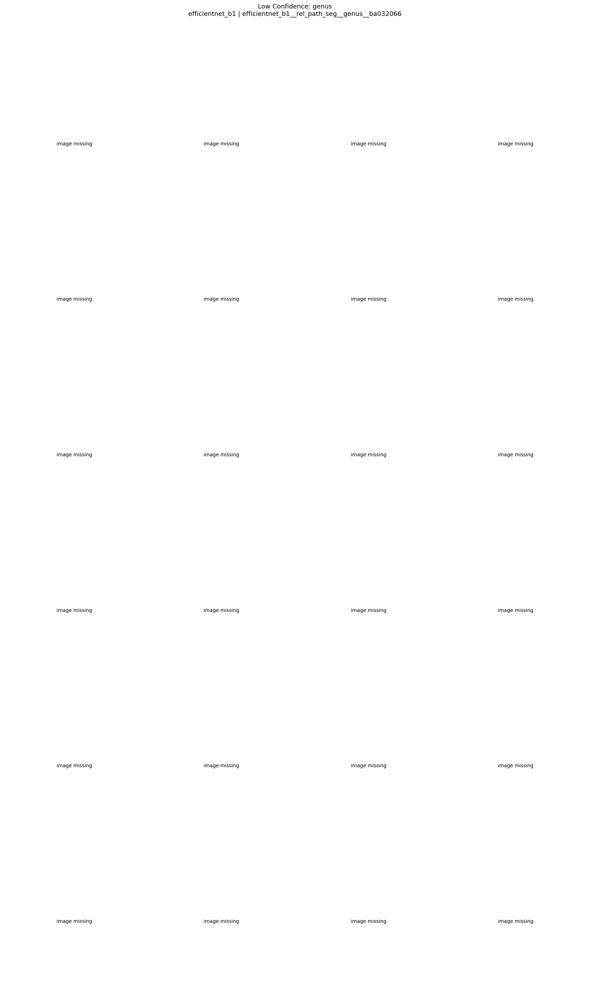

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_148/Aporrectodea_caliginosa_tuberculata_Juvenile_148_4/Aporrectodea_caliginosa_tuberculata_Juvenile_148_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_148/Aporrectodea_caliginosa_tuberculata_Juvenile_148_4

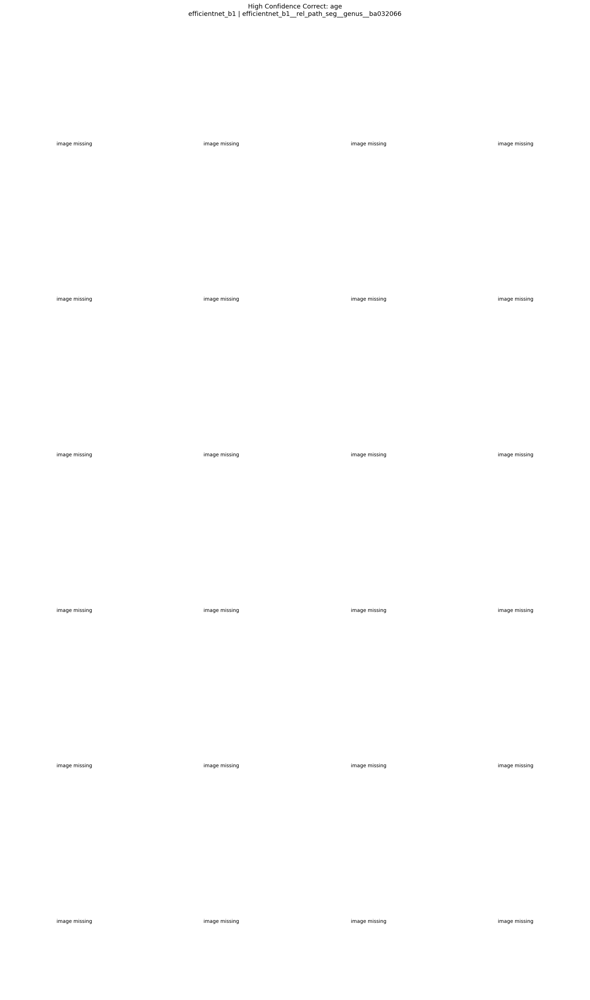

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_228/Aporrectodea_caliginosa_tuberculata_Juvenile_228_6/Aporrectodea_caliginosa_tuberculata_Juvenile_228_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_228/Aporrectodea_caliginosa_tuberculata_Juvenile_228_6/Aporrectodea_caliginosa_tuberculata_Juvenile_228_6_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_383/Aporrectodea_caliginosa_tuberculata_Juvenile_383_6/Aporrectodea_caliginosa_tuberculata_Juvenile_383_6_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrecto

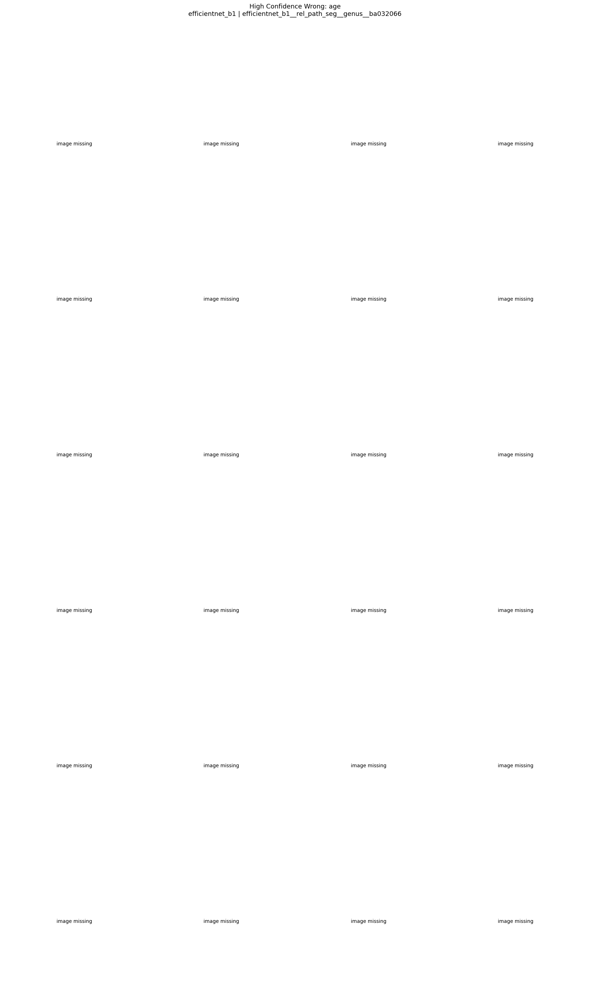

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Juvenile_11/Aporrectodea_rosea_Juvenile_11_3/Aporrectodea_rosea_Juvenile_11_3_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_rosea_Juvenile_11/Aporrectodea_rosea_Juvenile_11_3/Aporrectodea_rosea_Juvenile_11_3_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_65/Aporrectodea_caliginosa_tuberculata_Juvenile_65_4/Aporrectodea_caliginosa_tuberculata_Juvenile_65_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_65/Aporrectodea_caliginosa_tuberculata_Juvenile_65_4/Aporrectodea_caliginos

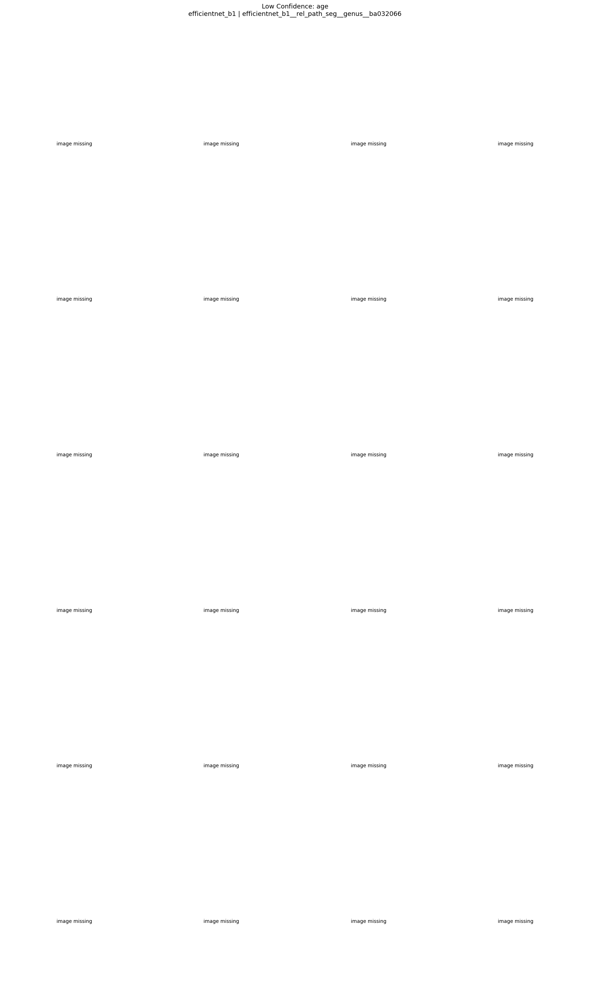

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_44/Aporrectodea_tuberculata_Adult_44_1/Aporrectodea_tuberculata_Adult_44_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_44/Aporrectodea_tuberculata_Adult_44_1/Aporrectodea_tuberculata_Adult_44_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_terrestris_herculeus_Adult_07/Lumbricus_sp_terrestris_herculeus_Adult_07_7/Lumbricus_sp_terrestris_herculeus_Adult_07_7_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_terrestris_herculeus_Adult_07/Lumbricus_sp_terrestris_herculeus_Adult_07_7/Lumbricus_sp_terrestris_hercu

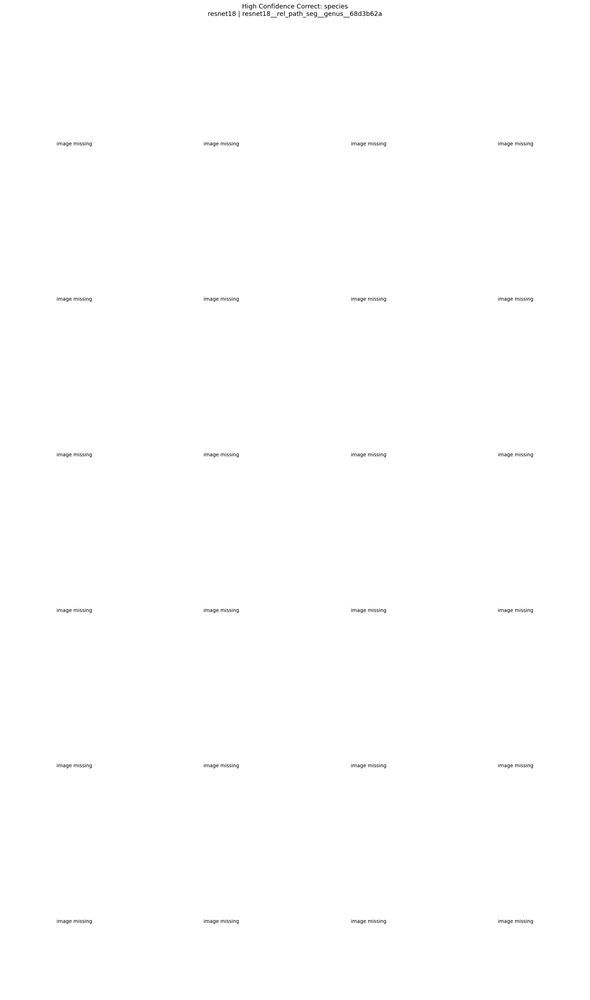

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_1/Aporrectodea_caliginosa_Adult_14_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_1/Aporrectodea_caliginosa_Adult_14_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_4/Aporrectodea_caliginosa_Adult_14_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_4/Aporrectodea_caliginosa_Adult_14_4_seg.jpg'
  warnings.warn(f"Could not load image {p

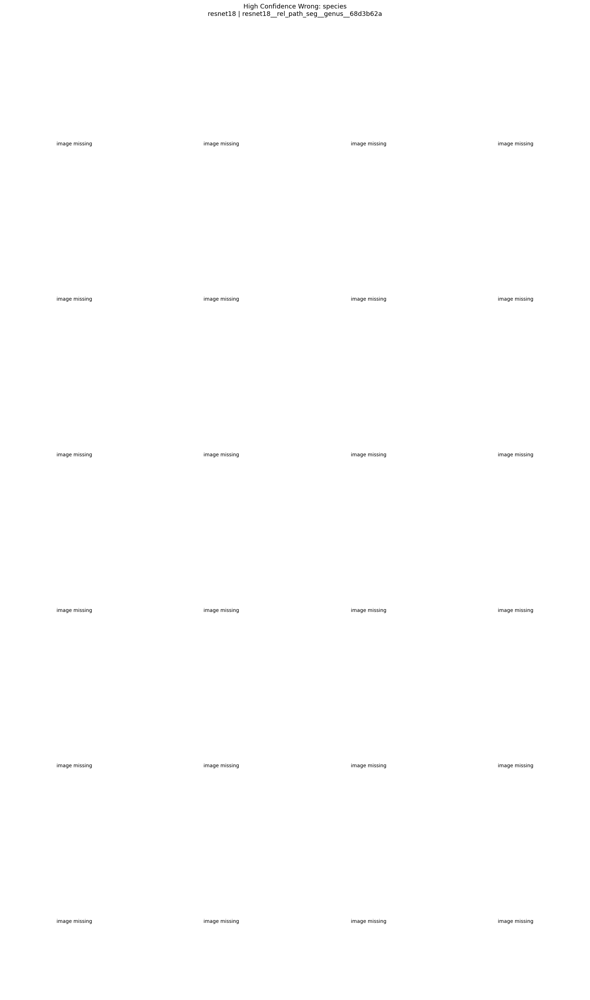

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_24/Aporrectodea_longa_Juvenile_24_3/Aporrectodea_longa_Juvenile_24_3_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_24/Aporrectodea_longa_Juvenile_24_3/Aporrectodea_longa_Juvenile_24_3_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_24/Aporrectodea_longa_Juvenile_24_4/Aporrectodea_longa_Juvenile_24_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_longa_Juvenile_24/Aporrectodea_longa_Juvenile_24_4/Aporrectodea_longa_Juvenile_24_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipyke

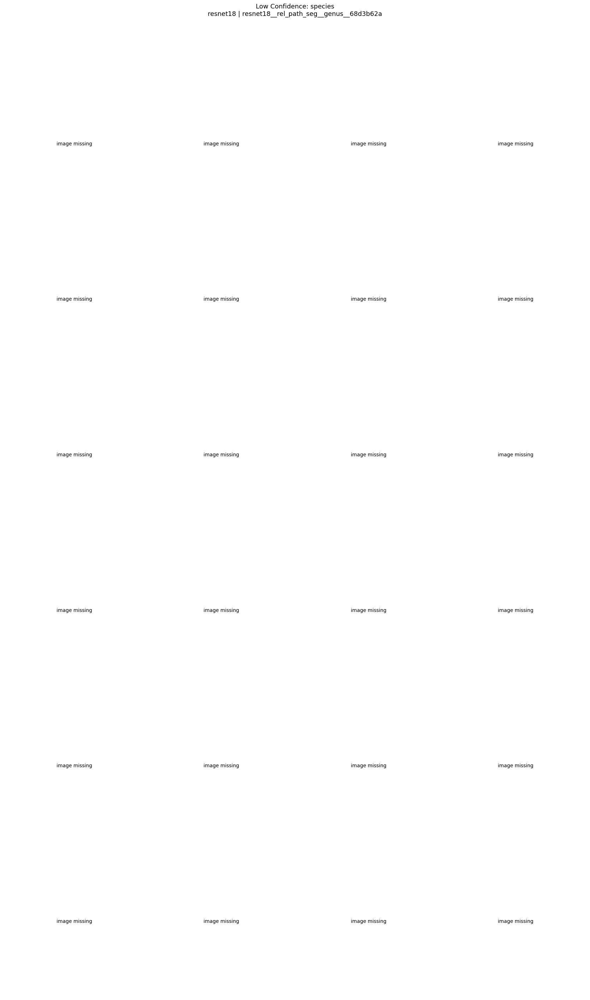

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_113/Lumbricus_sp_Juvenile_113_7/Lumbricus_sp_Juvenile_113_7_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_113/Lumbricus_sp_Juvenile_113_7/Lumbricus_sp_Juvenile_113_7_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_38/Lumbricus_sp_Juvenile_38_4/Lumbricus_sp_Juvenile_38_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_38/Lumbricus_sp_Juvenile_38_4/Lumbricus_sp_Juvenile_38_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /m

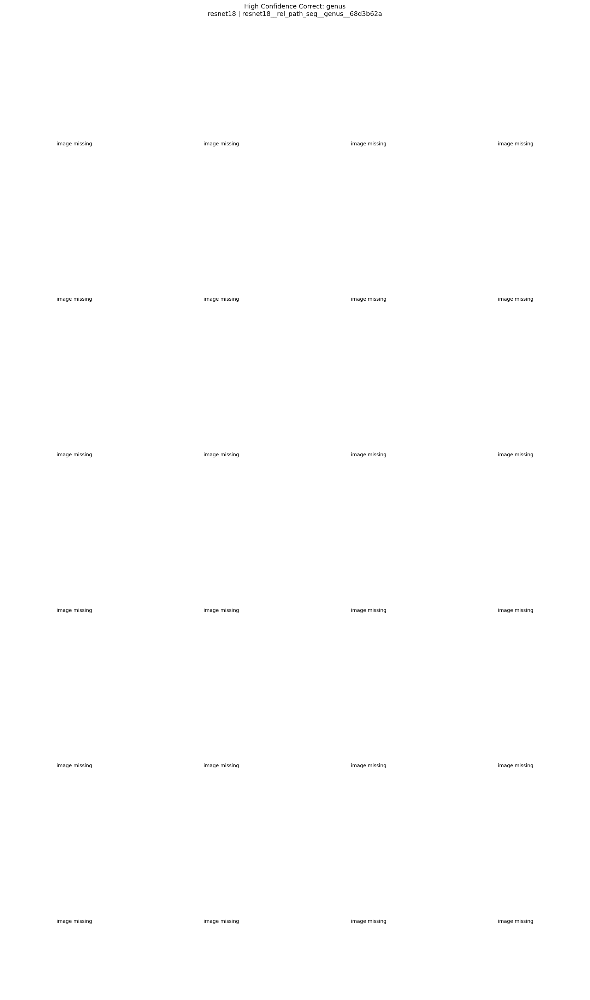

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_30/Aporrectodea_caliginosa_tuberculata_Juvenile_30_2/Aporrectodea_caliginosa_tuberculata_Juvenile_30_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_30/Aporrectodea_caliginosa_tuberculata_Juvenile_30_2/Aporrectodea_caliginosa_tuberculata_Juvenile_30_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_34/Allolobophora_chlorotica_Juvenile_34_4/Allolobophora_chlorotica_Juvenile_34_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_34/Allolobophora_

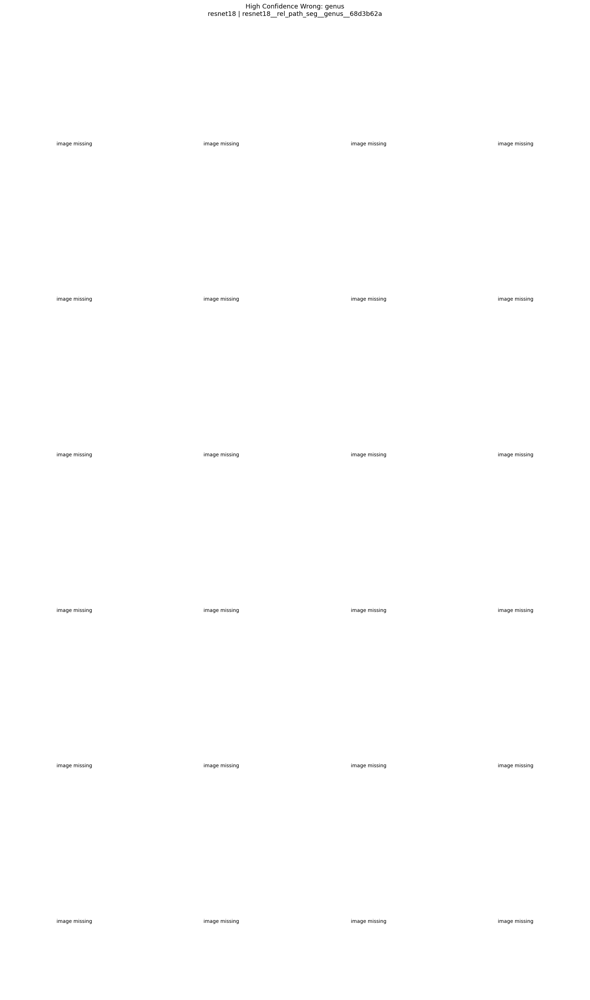

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_20/Aporrectodea_tuberculata_Adult_20_5/Aporrectodea_tuberculata_Adult_20_5_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_20/Aporrectodea_tuberculata_Adult_20_5/Aporrectodea_tuberculata_Adult_20_5_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_151/Lumbricus_sp_Juvenile_151_4/Lumbricus_sp_Juvenile_151_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_sp_Juvenile_151/Lumbricus_sp_Juvenile_151_4/Lumbricus_sp_Juvenile_151_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/

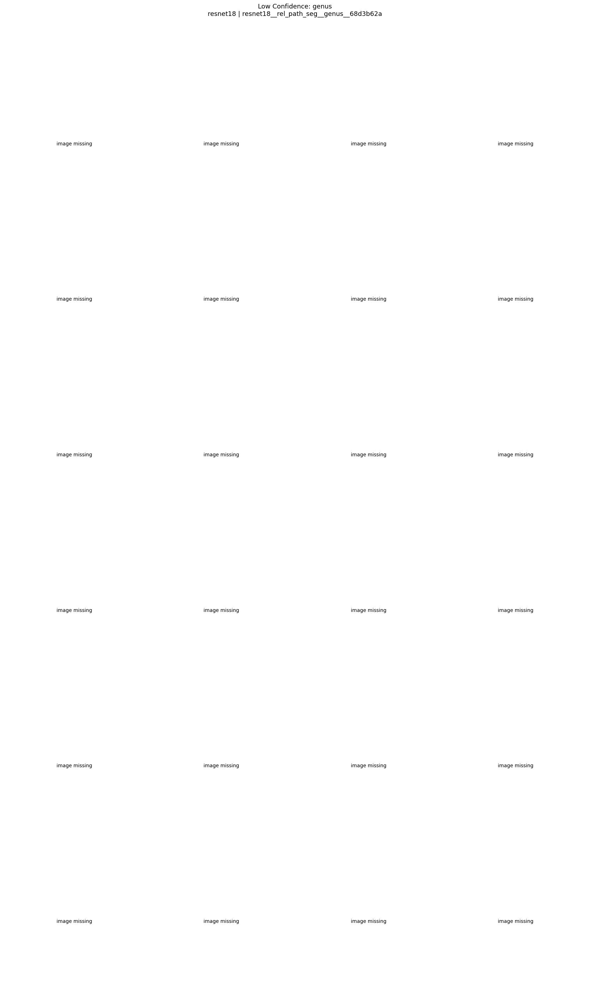

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_44/Aporrectodea_tuberculata_Adult_44_1/Aporrectodea_tuberculata_Adult_44_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_44/Aporrectodea_tuberculata_Adult_44_1/Aporrectodea_tuberculata_Adult_44_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg'
  warnings.warn(f"Could not l

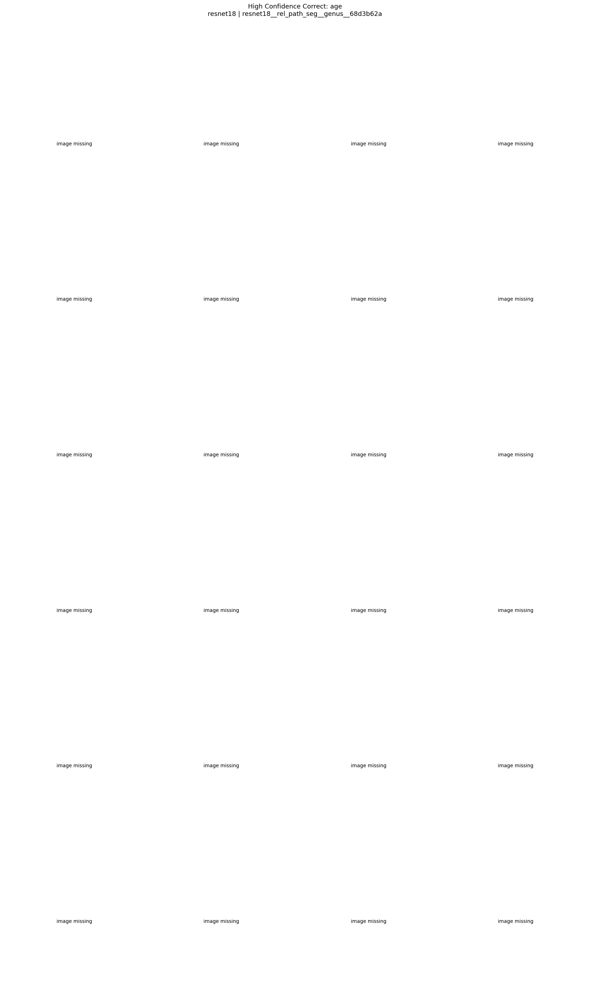

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_castaneus_Adult_02/Lumbricus_castaneus_Adult_02_1/Lumbricus_castaneus_Adult_02_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Lumbricus_castaneus_Adult_02/Lumbricus_castaneus_Adult_02_1/Lumbricus_castaneus_Adult_02_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_147/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_tuberculata_Juvenile_147/Aporrectodea_caliginosa_tuberculata_Juvenile_147_4/Aporrectodea_caliginosa_tuber

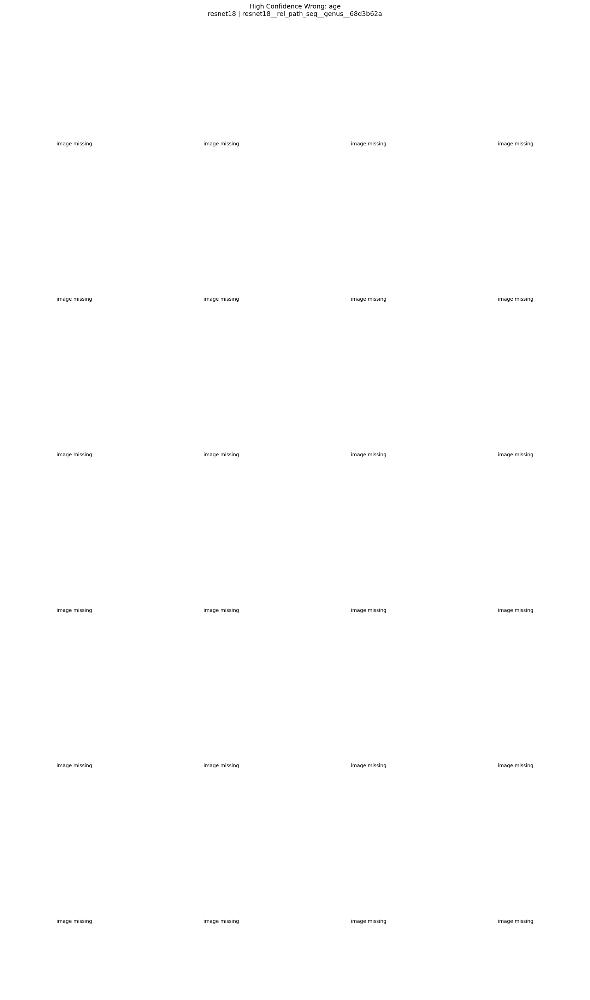

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_90/Allolobophora_chlorotica_Juvenile_90_2/Allolobophora_chlorotica_Juvenile_90_2_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_90/Allolobophora_chlorotica_Juvenile_90_2/Allolobophora_chlorotica_Juvenile_90_2_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_84/Allolobophora_chlorotica_Juvenile_84_4/Allolobophora_chlorotica_Juvenile_84_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Allolobophora_chlorotica_Juvenile_84/Allolobophora_chlorotica_Juvenile_84_4/Allolobophora_chlorotica_Juvenile_84_4_se

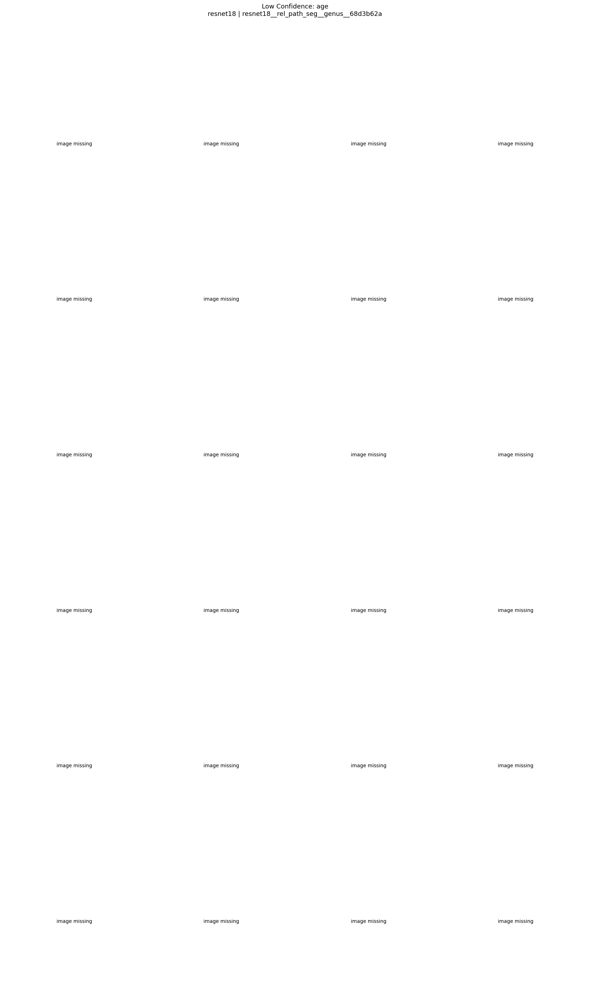

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_66/Aporrectodea_tuberculata_Adult_66_4/Aporrectodea_tuberculata_Adult_66_4_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_97/Aporrectodea_tuberculata_Adult_97_1/Aporrectodea_tuberculata_Adult_97_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_tuberculata_Adult_97/Aporrectodea_tuberculata_Adult_97_1/Aporrectodea_tuberculata_Adult_97_1_seg.jpg'
  warnings.warn(f"Could not l

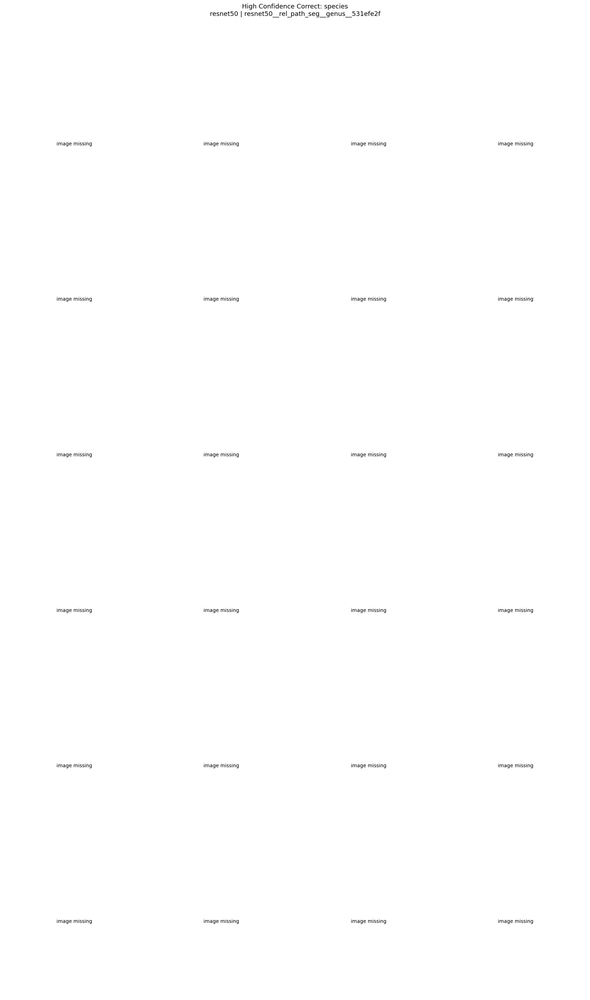

/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_1/Aporrectodea_caliginosa_Adult_14_1_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_1/Aporrectodea_caliginosa_Adult_14_1_seg.jpg'
  warnings.warn(f"Could not load image {path}: {exc}")
/tmp/ipykernel_595351/3420146710.py:11: UserWarning: Could not load image /mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_4/Aporrectodea_caliginosa_Adult_14_4_seg.jpg: [Errno 2] No such file or directory: '/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/Aporrectodea_caliginosa_Adult_14/Aporrectodea_caliginosa_Adult_14_4/Aporrectodea_caliginosa_Adult_14_4_seg.jpg'
  warnings.warn(f"Could not load image {p

KeyboardInterrupt: 

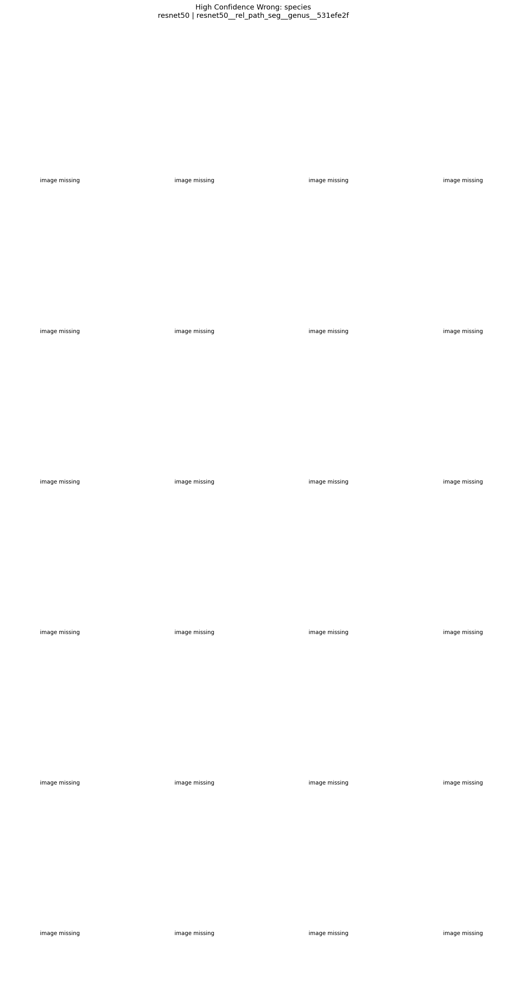

In [16]:
gallery_paths = []

for (model_type, run_name), model_df in test_predictions.groupby(["model_type", "run_name"], dropna=False):
    model_dir = GALLERY_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)

    for task in TASKS:
        prob_col = f"{task}_prob"
        correct_col = f"{task}_correct"
        true_col = f"{task}_true"
        pred_col = f"{task}_pred"

        df = valid_for_task(model_df, task)
        df = df[df[prob_col].notna() & df[correct_col].notna()].copy()

        if len(df) == 0:
            continue

        df[prob_col] = df[prob_col].astype(float)

        cases = {
            "high_confidence_correct": df[df[correct_col] == True].sort_values(prob_col, ascending=False).head(N_GALLERY_IMAGES),
            "high_confidence_wrong": df[df[correct_col] == False].sort_values(prob_col, ascending=False).head(N_GALLERY_IMAGES),
            "low_confidence": df.sort_values(prob_col, ascending=True).head(N_GALLERY_IMAGES),
        }

        subtitle_cols = ["image_name", true_col, pred_col, prob_col]

        for case_name, case_df in cases.items():
            path = model_dir / f"{task}_{case_name}.png"
            out = plot_image_gallery(
                case_df,
                title=f"{case_name.replace('_', ' ').title()}: {task}\n{model_type} | {run_name}",
                out_path=path,
                subtitle_cols=subtitle_cols,
            )
            if out is not None:
                gallery_paths.append(out)

print("Saved galleries:", len(gallery_paths))
for p in gallery_paths[:40]:
    print(p)
if len(gallery_paths) > 40:
    print(f"... plus {len(gallery_paths)-40} more")


In [ ]:
# Model-disagreement galleries
disagreement_gallery_paths = []

for task in TASKS:
    sub = agreement_image_df[
        (agreement_image_df["task"] == task)
        & (agreement_image_df["agreement_category"].isin([
            "all_agree_wrong",
            "disagree_at_least_one_correct",
            "disagree_none_correct",
        ]))
    ].copy()

    for category, cat_df in sub.groupby("agreement_category"):
        path = GALLERY_DIR / "model_disagreement" / f"{task}_{category}.png"
        out = plot_image_gallery(
            cat_df,
            title=f"Model-family agreement category: {category}\nTask: {task}",
            out_path=path,
            subtitle_cols=["image_name", "true_label", "consensus_pred", "prediction_counts"],
        )
        if out is not None:
            disagreement_gallery_paths.append(out)

print("Saved disagreement galleries:", len(disagreement_gallery_paths))
for p in disagreement_gallery_paths:
    print(p)


# 9. Confounding checks

In [ ]:
CONF_DIR = ADVANCED_DIR / "09_confounding_checks"
CONF_DIR.mkdir(parents=True, exist_ok=True)


def image_quality_features(image_path) -> dict:
    p = Path(image_path)

    try:
        img = Image.open(p).convert("RGB")
        arr = np.asarray(img).astype(np.float32)
        gray = arr.mean(axis=2)

        fg = gray > 5
        fg_area_fraction = float(fg.mean())

        if fg.sum() > 20:
            ys, xs = np.where(fg)
            x1, x2 = xs.min(), xs.max() + 1
            y1, y2 = ys.min(), ys.max() + 1
            bbox_w = x2 - x1
            bbox_h = y2 - y1
            bbox_area_fraction = float((bbox_w * bbox_h) / (gray.shape[0] * gray.shape[1]))
            bbox_aspect = float(bbox_w / max(bbox_h, 1))
        else:
            bbox_area_fraction = np.nan
            bbox_aspect = np.nan

        return {
            "image_path": str(p),
            "image_exists": True,
            "image_width": img.size[0],
            "image_height": img.size[1],
            "brightness": float(gray.mean()),
            "contrast": float(gray.std()),
            "foreground_area_fraction": fg_area_fraction,
            "bbox_area_fraction": bbox_area_fraction,
            "bbox_aspect": bbox_aspect,
            "parent_folder": p.parent.name,
            "grandparent_folder": p.parent.parent.name if p.parent.parent else "",
        }

    except Exception as exc:
        return {
            "image_path": str(p),
            "image_exists": False,
            "image_error": repr(exc),
            "image_width": np.nan,
            "image_height": np.nan,
            "brightness": np.nan,
            "contrast": np.nan,
            "foreground_area_fraction": np.nan,
            "bbox_area_fraction": np.nan,
            "bbox_aspect": np.nan,
            "parent_folder": p.parent.name,
            "grandparent_folder": p.parent.parent.name if p.parent.parent else "",
        }


unique_images = test_predictions[["image_path"]].drop_duplicates().reset_index(drop=True)
feature_rows = []

for image_path in tqdm(unique_images["image_path"], desc="Computing image features"):
    feature_rows.append(image_quality_features(image_path))

image_features = pd.DataFrame(feature_rows)

image_features_path = CONF_DIR / "test_image_quality_features.csv"
image_features.to_csv(image_features_path, index=False)

confounding_df = test_predictions.merge(image_features, on="image_path", how="left")

confounding_path = CONF_DIR / "test_predictions_with_image_quality_features.csv"
confounding_df.to_csv(confounding_path, index=False)

print("Saved:", image_features_path)
print("Saved:", confounding_path)
display(image_features.head())


In [ ]:
FEATURES_TO_CHECK = [
    "brightness",
    "contrast",
    "foreground_area_fraction",
    "bbox_area_fraction",
    "bbox_aspect",
]


def binned_accuracy_table(df, feature_col, task, n_bins=5):
    correct_col = f"{task}_correct"

    if feature_col not in df.columns or correct_col not in df.columns:
        return pd.DataFrame()

    sub = valid_for_task(df, task)
    sub = sub[sub[feature_col].notna() & sub[correct_col].notna()].copy()

    if len(sub) == 0:
        return pd.DataFrame()

    try:
        sub["feature_bin"] = pd.qcut(sub[feature_col], q=n_bins, duplicates="drop")
    except ValueError:
        return pd.DataFrame()

    rows = []
    for interval, group in sub.groupby("feature_bin", observed=False):
        rows.append({
            "feature": feature_col,
            "task": task,
            "bin": str(interval),
            "bin_mid": float((interval.left + interval.right) / 2),
            "n": int(len(group)),
            "accuracy": float(group[correct_col].astype(bool).mean()),
            "feature_mean": float(group[feature_col].mean()),
        })

    return pd.DataFrame(rows)


binned_rows = []

for (model_type, run_name), model_df in confounding_df.groupby(["model_type", "run_name"], dropna=False):
    for task in TASKS:
        for feature in FEATURES_TO_CHECK:
            tab = binned_accuracy_table(model_df, feature, task, n_bins=5)
            if len(tab):
                tab["model_type"] = model_type
                tab["run_name"] = run_name
                binned_rows.append(tab)

binned_accuracy = pd.concat(binned_rows, ignore_index=True) if binned_rows else pd.DataFrame()

binned_accuracy_path = CONF_DIR / "accuracy_by_image_feature_bins.csv"
binned_accuracy.to_csv(binned_accuracy_path, index=False)

print("Saved:", binned_accuracy_path)
display(binned_accuracy.head())


In [ ]:
def plot_confounding_feature_curves(binned_df, model_type, run_name, out_dir):
    sub = binned_df[
        (binned_df["model_type"] == model_type)
        & (binned_df["run_name"] == run_name)
    ].copy()

    if len(sub) == 0:
        return None

    fig, axes = plt.subplots(
        len(FEATURES_TO_CHECK),
        len(TASKS),
        figsize=(4.5 * len(TASKS), 3.0 * len(FEATURES_TO_CHECK)),
        squeeze=False,
        sharey=True,
    )

    for row_i, feature in enumerate(FEATURES_TO_CHECK):
        for col_i, task in enumerate(TASKS):
            ax = axes[row_i, col_i]
            plot_df = sub[(sub["feature"] == feature) & (sub["task"] == task)].sort_values("feature_mean")

            if len(plot_df) == 0:
                ax.axis("off")
                continue

            ax.plot(plot_df["feature_mean"], plot_df["accuracy"], marker="o")
            ax.set_ylim(0, 1)
            ax.set_title(f"{task} | {feature}", fontsize=9)
            ax.set_xlabel(feature)
            if col_i == 0:
                ax.set_ylabel("Accuracy")

            for _, r in plot_df.iterrows():
                ax.text(r["feature_mean"], r["accuracy"], str(int(r["n"])), fontsize=7)

    fig.suptitle(f"Accuracy by image-feature bins\n{model_type} | {run_name}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    path = out_dir / "accuracy_by_image_feature_bins.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


confounding_plot_paths = []

for (model_type, run_name), _ in confounding_df.groupby(["model_type", "run_name"], dropna=False):
    model_dir = CONF_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)
    out = plot_confounding_feature_curves(binned_accuracy, model_type, run_name, model_dir)
    if out is not None:
        confounding_plot_paths.append(out)

print("Saved confounding plots:")
for p in confounding_plot_paths:
    print(p)


In [ ]:
# Accuracy by parent folder/session proxy.
folder_rows = []

for (model_type, run_name), model_df in confounding_df.groupby(["model_type", "run_name"], dropna=False):
    for task in TASKS:
        correct_col = f"{task}_correct"
        sub = valid_for_task(model_df, task)
        sub = sub[sub[correct_col].notna()].copy()

        for folder, g in sub.groupby("parent_folder", dropna=False):
            if len(g) < 10:
                continue
            folder_rows.append({
                "model_type": model_type,
                "run_name": run_name,
                "task": task,
                "parent_folder": folder,
                "n": len(g),
                "accuracy": g[correct_col].astype(bool).mean(),
            })

folder_accuracy = pd.DataFrame(folder_rows)

folder_accuracy_path = CONF_DIR / "accuracy_by_parent_folder_min10.csv"
folder_accuracy.to_csv(folder_accuracy_path, index=False)

print("Saved:", folder_accuracy_path)
display(folder_accuracy.sort_values("accuracy").head(30))


# 10. Species × age interaction

In [ ]:
SPAGE_DIR = ADVANCED_DIR / "10_species_age_interaction"
SPAGE_DIR.mkdir(parents=True, exist_ok=True)


def species_age_interaction_table(pred_df: pd.DataFrame) -> pd.DataFrame:
    if "species_true" not in pred_df.columns or "age_true" not in pred_df.columns:
        print("species_true and/or age_true not available.")
        return pd.DataFrame()

    rows = []

    for (model_type, run_name), model_df in pred_df.groupby(["model_type", "run_name"], dropna=False):
        for (species_label, age_label), group in model_df.groupby(["species_true", "age_true"], dropna=False):
            row = {
                "model_type": model_type,
                "run_name": run_name,
                "species_true": species_label,
                "age_true": age_label,
                "n_images": len(group),
                "n_individuals": group["group_id"].nunique(),
            }

            for task in TASKS:
                g = valid_for_task(group, task)
                scores = compute_scores(g[f"{task}_true"], g[f"{task}_pred"])
                for metric, value in scores.items():
                    row[f"{task}_{metric}"] = value

            rows.append(row)

    return pd.DataFrame(rows)


species_age_df = species_age_interaction_table(test_predictions)

species_age_path = SPAGE_DIR / "species_age_interaction_image_level.csv"
species_age_df.to_csv(species_age_path, index=False)

print("Saved:", species_age_path)
display(species_age_df.head())


In [ ]:
def plot_species_age_heatmap_for_model(df, model_type, run_name, metric_col, out_dir):
    sub = df[
        (df["model_type"] == model_type)
        & (df["run_name"] == run_name)
    ].copy()

    if len(sub) == 0 or metric_col not in sub.columns:
        return None

    pivot = sub.pivot_table(index="species_true", columns="age_true", values=metric_col, aggfunc="mean")

    if pivot.empty:
        return None

    fig, ax = plt.subplots(figsize=(max(7, 0.75 * len(pivot.columns)), max(5, 0.35 * len(pivot.index))))
    im = ax.imshow(pivot.values, vmin=0, vmax=1)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=metric_col)

    ax.set_xticks(range(len(pivot.columns)))
    ax.set_yticks(range(len(pivot.index)))
    ax.set_xticklabels(pivot.columns.astype(str), rotation=45, ha="right")
    ax.set_yticklabels(pivot.index.astype(str))
    ax.set_xlabel("Age")
    ax.set_ylabel("Species")
    ax.set_title(f"{metric_col} by species × age\n{model_type} | {run_name}")

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            value = pivot.iloc[i, j]
            text = "" if pd.isna(value) else f"{value:.2f}"
            ax.text(j, i, text, ha="center", va="center", fontsize=8)

    plt.tight_layout()

    path = out_dir / f"species_age_heatmap_{safe_slug(metric_col)}.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


species_age_plot_paths = []

if len(species_age_df):
    for (model_type, run_name), _ in species_age_df.groupby(["model_type", "run_name"], dropna=False):
        model_dir = SPAGE_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
        model_dir.mkdir(parents=True, exist_ok=True)

        for metric_col in ["species_accuracy", "age_accuracy", "genus_accuracy"]:
            out = plot_species_age_heatmap_for_model(
                species_age_df, model_type, run_name, metric_col, model_dir
            )
            if out is not None:
                species_age_plot_paths.append(out)

print("Saved species × age plots:")
for p in species_age_plot_paths:
    print(p)


# 11. Bootstrap confidence intervals by individual

In [ ]:
BOOT_DIR = ADVANCED_DIR / "11_bootstrap_confidence_intervals"
BOOT_DIR.mkdir(parents=True, exist_ok=True)


def bootstrap_scores_by_individual_image_level(pred_df, task, n_bootstraps=N_BOOTSTRAPS, seed=RANDOM_STATE):
    rng = np.random.default_rng(seed)
    g = valid_for_task(pred_df, task)
    g = g[g["group_id"].notna()].copy()

    groups = g["group_id"].astype(str).unique()
    rows = []

    if len(groups) == 0:
        return pd.DataFrame()

    for b in range(n_bootstraps):
        sampled_groups = rng.choice(groups, size=len(groups), replace=True)
        boot = pd.concat(
            [g[g["group_id"].astype(str) == group_id] for group_id in sampled_groups],
            ignore_index=True,
        )

        scores = compute_scores(boot[f"{task}_true"], boot[f"{task}_pred"])
        scores["bootstrap"] = b
        rows.append(scores)

    return pd.DataFrame(rows)


def bootstrap_scores_by_individual_aggregated(agg_df, task, method, n_bootstraps=N_BOOTSTRAPS, seed=RANDOM_STATE):
    rng = np.random.default_rng(seed)

    df = agg_df[
        (agg_df["task"] == task)
        & (agg_df["method"] == method)
        & agg_df["group_id"].notna()
        & agg_df["true_label"].notna()
        & agg_df["pred_label"].notna()
    ].copy()

    groups = df["group_id"].astype(str).unique()
    rows = []

    if len(groups) == 0:
        return pd.DataFrame()

    for b in range(n_bootstraps):
        sampled_groups = rng.choice(groups, size=len(groups), replace=True)
        boot = pd.concat(
            [df[df["group_id"].astype(str) == group_id] for group_id in sampled_groups],
            ignore_index=True,
        )

        scores = compute_scores(boot["true_label"], boot["pred_label"])
        scores["bootstrap"] = b
        rows.append(scores)

    return pd.DataFrame(rows)


def summarise_bootstrap_distribution(boot_df):
    out = {}
    for metric in METRICS:
        vals = boot_df[metric].dropna()
        if len(vals) == 0:
            out[f"{metric}_mean"] = np.nan
            out[f"{metric}_ci_low"] = np.nan
            out[f"{metric}_ci_high"] = np.nan
        else:
            out[f"{metric}_mean"] = float(vals.mean())
            out[f"{metric}_ci_low"] = float(np.percentile(vals, 2.5))
            out[f"{metric}_ci_high"] = float(np.percentile(vals, 97.5))
    return out


In [ ]:
bootstrap_summary_rows = []

for (model_type, run_name), model_df in tqdm(
    list(test_predictions.groupby(["model_type", "run_name"], dropna=False)),
    desc="Bootstrap image-level",
):
    for task in TASKS:
        boot = bootstrap_scores_by_individual_image_level(model_df, task)
        if len(boot) == 0:
            continue

        bootstrap_summary_rows.append({
            "model_type": model_type,
            "run_name": run_name,
            "level": "image",
            "aggregation": "none",
            "task": task,
            **summarise_bootstrap_distribution(boot),
        })

for (model_type, run_name), model_agg in tqdm(
    list(individual_agg_predictions.groupby(["model_type", "run_name"], dropna=False)),
    desc="Bootstrap individual-level",
):
    for task in TASKS:
        for method in AGG_METHODS:
            boot = bootstrap_scores_by_individual_aggregated(model_agg, task, method)
            if len(boot) == 0:
                continue

            bootstrap_summary_rows.append({
                "model_type": model_type,
                "run_name": run_name,
                "level": "individual",
                "aggregation": method,
                "task": task,
                **summarise_bootstrap_distribution(boot),
            })

bootstrap_summary = pd.DataFrame(bootstrap_summary_rows)

bootstrap_summary_path = BOOT_DIR / "bootstrap_ci_by_individual.csv"
bootstrap_summary.to_csv(bootstrap_summary_path, index=False)

print("Saved:", bootstrap_summary_path)
display(bootstrap_summary)


In [ ]:
def plot_bootstrap_ci_for_model(summary_df, model_type, run_name, metric, out_dir):
    sub = summary_df[
        (summary_df["model_type"] == model_type)
        & (summary_df["run_name"] == run_name)
    ].copy()

    sub["method_label"] = np.where(sub["level"] == "image", "image", sub["aggregation"].astype(str))
    methods = ["image"] + AGG_METHODS

    fig, axes = plt.subplots(1, len(TASKS), figsize=(5.2 * len(TASKS), 4.5), squeeze=False, sharey=True)
    axes = axes[0]

    for ax, task in zip(axes, TASKS):
        task_df = (
            sub[sub["task"] == task]
            .set_index("method_label")
            .reindex(methods)
            .reset_index()
        )

        mean_col = f"{metric}_mean"
        low_col = f"{metric}_ci_low"
        high_col = f"{metric}_ci_high"

        x = np.arange(len(task_df))
        means = task_df[mean_col].values
        lows = task_df[low_col].values
        highs = task_df[high_col].values
        yerr = np.vstack([means - lows, highs - means])

        ax.bar(x, means)
        ax.errorbar(x, means, yerr=yerr, fmt="none", capsize=4)
        ax.set_ylim(0, 1)
        ax.set_xticks(x)
        ax.set_xticklabels(task_df["method_label"], rotation=45, ha="right")
        ax.set_title(task)
        ax.set_ylabel(metric.replace("_", " "))

    fig.suptitle(f"Bootstrap 95% CI by individual: {metric}\n{model_type} | {run_name}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.90])

    path = out_dir / f"bootstrap_ci_{safe_slug(metric)}.png"
    fig.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    return path


bootstrap_plot_paths = []

for (model_type, run_name), _ in bootstrap_summary.groupby(["model_type", "run_name"], dropna=False):
    model_dir = BOOT_DIR / f"{safe_slug(model_type)}__{safe_slug(run_name)}"
    model_dir.mkdir(parents=True, exist_ok=True)

    for metric in METRICS:
        bootstrap_plot_paths.append(
            plot_bootstrap_ci_for_model(bootstrap_summary, model_type, run_name, metric, model_dir)
        )

print("Saved bootstrap CI plots:")
for p in bootstrap_plot_paths:
    print(p)


# Output folders

Main output folders:

```text
advanced_diagnostics/
├── 01_individual_aggregation_comparison/
├── 03_confidence_calibration/
├── 05_individual_prediction_stability/
├── 06_model_family_agreement/
├── 08_error_image_galleries/
├── 09_confounding_checks/
├── 10_species_age_interaction/
└── 11_bootstrap_confidence_intervals/
```

Important CSVs:

```text
aggregation_comparison_scores.csv
calibration_summary_ece.csv
individual_prediction_stability.csv
model_family_agreement_summary_image_level.csv
test_predictions_with_image_quality_features.csv
species_age_interaction_image_level.csv
bootstrap_ci_by_individual.csv
```
